## Autism Prediction - NLP Extraction Using `pylangacq` and Evaluation on Different Synthetic Data Generation Techniques in Comparison with Baseline Data Performance using Random Forest Classifier.

This notebook contains the extraction of chat data from Nadig dataset using `pylangacq`, generation of synthetic data using the baseline data, and evaluating each dataset, including a mixed method on the most performing dataset on balance classification and quantity, modeled using Random Forest Classifier. Also, an exploratory data analysis will be conducted on the most performing datasets, to understand the distribution of each dataset and how that could have impacted the performance of each model in comparison to the baseline dataset.

## 1.1 Installing and Importing Relevant Libraries
We will go ahead to install and import the relevant libraries we will need in our notebook, including the installation of `pylangacq`.

In [1]:
# install pylangacq
!pip install --upgrade -q pylangacq;

In [2]:
# Import relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#split our data for modelling
from sklearn.model_selection import train_test_split

# Preprocess our data
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder

# Generating Synthetic data
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, NearMiss, TomekLinks

# Building and evaluating our RandomForest Classifier Model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, precision_score, recall_score, plot_confusion_matrix
from sklearn import metrics

import re
import numpy as np
import pandas as pd

# NLP 
import pylangacq
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
import math

# set cientific notation for pandas
pd.set_option(
    "display.float_format", "{:,.3f}".format 
)

# define seed for random states and test_size
seed = 0

## 1.2 Defining Functions to be used in the notebook
To keep our notebook clean, We will go ahead to define different functions that would be used within the project, most especially for EDA, preprocessing and evaluation (the functions were retweaked so many times along the line).

Since we will be doing a lot of preprocessing with different data, it is best to define a function to preprocess and split the data

In [3]:
def split_preprocessor(df, target):
  # Split the data into train and test sets
  X = df.drop(target, axis=1)
  y = df[target]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                      random_state=0)

  # reset index after train test split
  X_train = X_train.reset_index(drop=True)
  y_train = y_train.reset_index(drop=True)
  X_test = X_test.reset_index(drop=True)
  y_test = y_test.reset_index(drop=True)

  # Identify categorical columns
  cat_cols = [col for col in X_train.columns if X_train[col].dtype == 'object']

  # Preprocess the categorical data
  enc = OneHotEncoder(handle_unknown='ignore')
  X_train_cat = pd.DataFrame(enc.fit_transform(X_train[cat_cols]).toarray(), columns=enc.get_feature_names(cat_cols))
  X_test_cat = pd.DataFrame(enc.transform(X_test[cat_cols]).toarray(), columns=enc.get_feature_names(cat_cols))

  # Preprocess the numerical data
  scaler = StandardScaler()
  X_train_num = pd.DataFrame(scaler.fit_transform(X_train.drop(cat_cols, axis=1)), columns=X_train.drop(cat_cols, axis=1).columns)
  X_test_num = pd.DataFrame(scaler.transform(X_test.drop(cat_cols, axis=1)), columns=X_test.drop(cat_cols, axis=1).columns)

  # Combine the preprocessed data
  X_train = pd.concat([X_train_cat, X_train_num], axis=1)
  X_test = pd.concat([X_test_cat, X_test_num], axis=1)

  #return the split data
  return scaler, X_train, X_test, y_train, y_test

We will also define a function to return our metrics for each model we have trained.

In [4]:
# Define function to return our metrics
def evaluate_model(model, X_test, y_test):
  
  # generate prediction with our model
  y_pred = model.predict(X_test)

  # Generate different metric value
  f1_score_value = f1_score(y_test, y_pred)
  roc_auc_value = roc_auc_score(y_test, y_pred)
  accuracy_value = accuracy_score(y_test, y_pred)
  precision_value = precision_score(y_test, y_pred)
  recall_value = recall_score(y_test, y_pred)

  print("\033[1m\033[4mMETRICS\033[0m")
  print("F1 score: {:.2f}".format(f1_score_value))
  print("ROC-AUC: {:.2f}".format(roc_auc_value))
  print("Accuracy: {:.2f}".format(accuracy_value))
  print("Precision: {:.2f}".format(precision_value))
  print("Recall: {:.2f}".format(recall_value))

  # Display line break
  print("\n")

  # classification report
  cr = classification_report(y_test, y_pred)
  print(cr)

  # Display line break
  print("\n")

  # Plotting our confusion matrix
  plot_confusion_matrix(model, X_test, y_test, display_labels=["ASD Trait Absent", "ASD Trait Present"])
  plt.show()

# Initialize the table to append our evaluation results as we fit each model
model_results = pd.DataFrame(columns=[])

Since the generation of our synthetic training data will be an iterative process with the use of different techniques and evaluation with thesame model, to also improve readability, we will also define a function to test each of the classical techniques used in synthesizing data. Kindly note that the relevant library required has been installed earlier.

In [5]:
# define function to synthesize training data and train a model
def syn_training_data(technique, X_train, y_train):
  # Apply the sampler
  X_train_sampled, y_train_sampled = technique.fit_resample(X_train, y_train)

  return X_train_sampled, y_train_sampled

We will also define a function to merge our synthetically generated X_train and y_train, so we can easily conduct EDA on them after modelling. Also, since there has been transformation on the dataset, we will use the `inverse_transform` method of the `StandardScaler` object to get our dataframe back without the standard scaling for the purpose of analysis.

In [6]:
def merge_df(X_train, y_train, scaler):
  """
  This function merges X_train and y_train into a new pandas dataframe and
  transforms it back from standard scaler to normal form.
  X_train: pandas dataframe of input features
  y_train: pandas dataframe of target variable
  """
  # Convert scaled dataframe to its original form
  X_train_original = pd.DataFrame(scaler.inverse_transform(X_train), columns=X_train.columns)

  # merge and return new dataframe
  merged_df = pd.concat([X_train_original, y_train], axis=1)
  return merged_df

We will generate another function to generate a new synthetic data based on selected technique on the overall data. (Note that the difference between this compared to the first one on the training set, is that training object is added to the function.

In [7]:
# define function to synthesize baseline data
def syn_baseline_data(df, target, technique):
  # Separate the target variable from the data
  X = df.drop(target, axis=1)
  y = df[target]

  # Perform resampling
  X_resampled, y_resampled = technique.fit_resample(X, y)

  # Combine the oversampled data
  df_resampled = pd.concat([X_resampled, y_resampled], axis=1)
  df_resampled.columns = X.columns.tolist() + [target]
  return df_resampled

We will also define a function to help us append the metrics of each model into a table for later comparison. The function will append the F1 score, ROC-AUC, accuracy, precision, recall of a fitted model to a table we would specify, such that once it is applied to another fitted model, it adds the metrics to a new line when called. Also, if the column name is not already available at first, this should be automatically added. We should also be able to add some description of the model as a column in the table, when calling the function.

In [8]:
# Define the function to append results for comparison
def append_metrics(model, X_test, y_test, table, data_desc=None):
  y_pred = model.predict(X_test)

  f1_score_value = f1_score(y_test, y_pred)
  roc_auc_value = roc_auc_score(y_test, y_pred)
  accuracy_value = accuracy_score(y_test, y_pred)
  precision_value = precision_score(y_test, y_pred)
  recall_value = recall_score(y_test, y_pred)

  metrics = {
      "Data Description": data_desc,
      "F1 Score": f1_score_value,
      "ROC AUC": roc_auc_value,
      "Accuracy": accuracy_value,
      "Precision": precision_value,
      "Recall": recall_value
  }

  for metric_name, value in metrics.items():
      if metric_name not in table.columns:
          table[metric_name] = None
          
  new_row = pd.DataFrame(metrics, index=[0])
  table = table.append(new_row, ignore_index=True)

  return table

We will also write a function to perform detailed univariate analysis on all numerical and categorical variables in our dataframe. The function will first select all numerical columns and categorical columns separately using `df.select_dtypes()`. Then it creates a subplot with the number of rows equal to the total number of columns and the number of columns equal to 2 (one for the plot and one for the boxplot).

Next, the function uses a for loop to plot the histogram and boxplot for each numerical column. Similarly, it plots the count plot and boxplot for each categorical column, with the numerical column with the most data points. We will add a title to each histogram indicating the mean, median, max, and standard deviation of each numerical column.

Note: This function assumes that the data frame has no missing values or the missing values have been dealt with beforehand. Also, we will be able to adjust the plot size and add any additional visualizations as we want in the long run.

In [9]:
# define univariate analysis function
def univariate_analysis(df):
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns
    cat_cols = df.select_dtypes(include=['object', 'category']).columns
    fig, axs = plt.subplots(len(num_cols) + len(cat_cols), 2, figsize=(10, (len(num_cols) + len(cat_cols)) * 4))

    for i, col in enumerate(num_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axs[i][0])
        sns.boxplot(data=df, x=col, ax=axs[i][1])
        axs[i][0].set_title(f"{col}\nMean: {df[col].mean():.2f} Median: {df[col].median():.2f} Max: {df[col].max():.2f} SD: {df[col].std():.2f}")

    for j, col in enumerate(cat_cols):
        sns.countplot(data=df, x=col, ax=axs[len(num_cols) + j][0])
        sns.boxplot(data=df, x=col, y=num_cols[0], ax=axs[len(num_cols) + j][1])
        axs[len(num_cols) + j][0].set_title(col)

    plt.tight_layout()
    plt.show()

We will also define a function that performs bivariate analysis.

The function first identifies the numeric and categorical columns. It then performs the following bivariate analysis:

- Numeric vs Numeric: scatter plot, regression plot, and histogram with hue.
- Categorical vs Categorical: two count plots with different axes.
- Numeric vs Categorical: box plot and violin plot.

For each type of analysis, the function creates a subplot with the number of rows equal to the number of bivariate comparisons and the number of columns equal to 2 (one for each plot). The function will use a for loop to iterate through each comparison and create the appropriate plots for each. The titles of each subplot indicate the type of bivariate analysis being performed, along with the variables being compared.

In [10]:
# define bivariate analysis function
def bivariate_analysis(df, label_col):
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns
    cat_cols = df.select_dtypes(include=['object', 'category']).columns
    
    # # convert label to categorical if necessary
    # label_col = df.columns[-1]
    # if df[label_col].dtype in ['int64', 'float64']:
    #     df[label_col] = df[label_col].astype('category')

    # # Numeric vs Numeric - commenting this as it was taking over one hour to process all the 68 numeric columns
    # print("Plotting Numeric vs Numeric Features")
    # num_vs_num = [(x,y) for x in num_cols for y in num_cols if x != y]
    # fig, axs = plt.subplots(len(num_vs_num), 2, figsize=(15, len(num_vs_num) * 6))

    # for i, (col1, col2) in enumerate(num_vs_num):
    #     sns.scatterplot(data=df, x=col1, y=col2, ax=axs[i][0])
    #     sns.regplot(data=df, x=col1, y=col2, ax=axs[i][0])
    #     sns.histplot(data=df, x=col1, kde=True, hue=col2, ax=axs[i][1])
    #     axs[i][0].set_title(f"{col1} vs {col2}")
    #     axs[i][1].set_title(f"{col1} (x) vs {col2} (hue)")

    # # Categorical vs Categorical - commenting this out as we only have a categorical data
    # print("PLotting Categorical vs Categorical Features")
    # cat_vs_cat = [(x,y) for x in cat_cols for y in cat_cols if x != y]
    # fig, axs = plt.subplots(len(cat_vs_cat), 2, figsize=(15, len(cat_vs_cat) * 6))

    # for i, (col1, col2) in enumerate(cat_vs_cat):
    #     sns.countplot(data=df, x=col1, hue=col2, ax=axs[i][0])
    #     sns.countplot(data=df, x=col2, hue=col1, ax=axs[i][1])
    #     axs[i][0].set_title(f"{col1} (x) vs {col2} (hue)")
    #     axs[i][1].set_title(f"{col2} (x) vs {col1} (hue)")

    # Numeric vs Categorical
    print("Plotting Numeric vs Categorical Features")
    num_vs_cat = [(x,y) for x in num_cols for y in cat_cols]
    num_plots_per_row = 5
    num_rows = int(np.ceil(len(num_vs_cat) / num_plots_per_row))
    fig, axs = plt.subplots(num_rows, num_plots_per_row, figsize=(25, num_rows * 3))

    for i, (num_col, cat_col) in enumerate(num_vs_cat):
        row_idx = i // num_plots_per_row
        col_idx = i % num_plots_per_row
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axs[row_idx][col_idx])
        axs[row_idx][col_idx].set_title(f"{cat_col} (x) vs {num_col} (y)")
        
        # set the y-axis limits slightly larger than the range of values
        y_min, y_max = df[num_col].min(), df[num_col].max()
        y_range = y_max - y_min
        axs[row_idx][col_idx].set_ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)

    # plot the charts
    plt.tight_layout()
    plt.show()

In [11]:
# define correlation matrix function
def correlation_matrix(df, label_col):
    # Check relationship between numeric features and label column
    print("Plotting Correlation Matrix")
    
    # Convert label column to numeric if it is not already numeric
    # if not pd.api.types.is_numeric_dtype(df[label_col]):
    #     df[label_col] = pd.to_numeric(df[label_col], errors='coerce')
    
    corr_matrix = df.corr()
    fig,ax = plt.subplots(figsize=(20,20))
    plt.title("Correlation Matrix to view relationships between numeric features and label column")
    ax = sns.heatmap(corr_matrix,
                    annot=False,
                    linewidths=0.5,
                    cmap='RdBu');
    # plot the charts
    plt.tight_layout()
    plt.show()

Now that we have all the major functions we will use defined, we will go ahead to extract our nadig chat data. Kindly note that as we move on, it is possible some additional functions will be defined within the notebook.

# 2. Extracting, Exploring and Modelling our Baseline Data
Few things that would be done in this section.

To help with our thought process, we will do the following in this notebook:

- Extract Nadig with different features for prediction of the label (ASD or not)
- Extract the features using the `pylangacq` library and features provided by `Gustavo Cunha`
- Conduct Univariate and Bivariate Exploratory Analysis on the baseline data
- Use the dataset for modeling using Random Forest Classifier, to have a baseline performance.

## 2.1 Extracting and Cleaning the Nadig Dataset

In [12]:
# Load file from path
file_path = "/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/Nadig.zip"
df = pylangacq.read_chat(file_path)

# create an empty dataframe 
df_extraction = pd.DataFrame()

# iterate over transcripts
for df_i in df:
    # create a dictionary for extracted features
    features_dict = {}
    
    ####### add values to dataframe #######
    # add ASD label
    features_dict["ASD"] = df_i.headers()[0]["Participants"]["CHI"]["group"]

    # get age of the child in months
    features_dict["age_in_months"] = math.ceil(df_i.ages(months=True)[0])

    # get non-child participants tags
    non_child_participants = list(df_i.headers()[0]["Participants"].keys())
    non_child_participants.remove('CHI')

    # get mlu
    child_mlu = df_i.mlu(participant='CHI')[0]    
    # get mean mlu for non-child participants
    mean_mlu_non_child = np.mean([df_i.mlu(participant=non_child)[0] 
                                  for non_child 
                                  in non_child_participants])
    # add child mlu
    features_dict["child_mlu"] = child_mlu
    # get percentage of child mlu / non-child mean mlu
    features_dict["percent_child_parents_mlu"] = child_mlu / mean_mlu_non_child

    # get mluw
    child_mluw = df_i.mluw(participant='CHI')[0]
    # get mean mluw for non-child participants
    mean_mluw_non_child = np.mean([df_i.mluw(participant=non_child)[0] 
                                  for non_child 
                                  in non_child_participants])
    # add child mluw
    features_dict["child_mluw"] = child_mluw
    # get percentage of child mluw / non-child mean mluw
    features_dict["percent_child_parents_mluw"] = child_mluw / mean_mluw_non_child

    # get ttr
    child_ttr = df_i.ttr(participant='CHI')[0]
    # get mean ttr for non-child participants
    mean_ttr_non_child = np.mean([df_i.ttr(participant=non_child)[0] 
                                  for non_child 
                                  in non_child_participants])
    # add child ttr
    features_dict["child_ttr"] = child_ttr
    # get percentage of child ttr / non-child mean ttr
    features_dict["percent_child_parents_ttr"] = child_ttr / mean_ttr_non_child

    # get ipsyn
    child_ipsyn = df_i.ipsyn(participant='CHI')[0]
    # get mean ipsyn for non-child participants
    mean_ipsyn_non_child = np.mean([df_i.ipsyn(participant=non_child)[0] 
                                    for non_child 
                                    in non_child_participants])
    # add child ipsyn
    features_dict["child_ipsyn"] = child_ipsyn
    # get percentage of child ipsyn / non-child mean ipsyn
    features_dict["percent_child_parents_ipsyn"] = child_ipsyn / mean_ipsyn_non_child

    # get number of words
    features_dict["child_num_words"] = len(df_i.words(participants="CHI"))
    # get percentage of child words / parent words
    features_dict["perct_child_parents_words"] = len(df_i.words(participants="CHI")) / len(df_i.words(exclude=("CHI")))
    # get number of unique words
    features_dict["child_num_unique_words"] = len(set(df_i.words(participants="CHI")))
    # get percentage of child unique words / parent unique words
    features_dict["perct_child_parents_unique_words"] = len(set(df_i.words(participants="CHI"))) / len(set(df_i.words(exclude=("CHI"))))

    # get number of tokens
    features_dict["child_num_tokens"] = len(df_i.tokens(participants="CHI"))
    # get percentage of child tokens / parent tokens
    features_dict["perct_child_parents_tokens"] = len(df_i.tokens(participants="CHI")) / len(df_i.tokens(exclude=("CHI")))

    # get number of utterances
    features_dict["child_utterances"] = len(df_i.utterances(participants="CHI"))
    # get percentage of child utterances / parent utterances
    features_dict["perct_child_parents_utterances"] = len(df_i.utterances(participants="CHI")) / len(df_i.utterances(exclude="CHI"))

    # get part of speech (POS) for every token in child utterances
    child_pos = [token.pos for token in df_i.tokens(participants="CHI")]   
    # get number of tokens
    num_tokens = features_dict["child_num_tokens"]
    # sanity check
    assert num_tokens == len(child_pos), "Missing POS tags!"
    
    # get values counts for pos
    pos_value_counts = pd.Series(child_pos).value_counts(dropna=False)
    # convert to dict
    pos_value_counts_dict = pos_value_counts.to_dict()
    # add pos_ prefix before pos tags
    pos_value_counts_dict = { ("pos_percent_" + str(k)): (v / num_tokens) for k, v in pos_value_counts_dict.items() }
    # sanity check 
    assert abs(1 - sum([*pos_value_counts_dict.values()])) < 0.01, "Missing POS tags!"
    
    # add pos_value_counts_dict to features_dict
    features_dict = {**features_dict, **pos_value_counts_dict}
    # create a pandas dataframe from features dict
    df_features = pd.DataFrame(data=features_dict, index=[0])

    # concatenate features dataframe with extraction dataframe
    df_extraction = pd.concat(objs=[df_extraction, df_features], ignore_index=True)

In [13]:
# Copy our extracted dataset
df = df_extraction.copy()

# Export our extracted dataset
df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nadig_extracted.csv', index=False)

# check columns with null values
df.isna().sum()

ASD                           0
age_in_months                 0
child_mlu                     0
percent_child_parents_mlu     0
child_mluw                    0
                             ..
pos_percent_chi              33
pos_percent_pro:poss         34
pos_percent_n:let            37
pos_percent_bab              36
pos_percent_sing             37
Length: 71, dtype: int64

Since we have some missing values, we will replace them all with 0.

In [14]:
# fill missing values with 0
df.fillna(value=0, inplace=True)

# sanity check
assert df.isna().sum().sum() == 0, "There are missing values!"

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 71 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   ASD                               38 non-null     object 
 1   age_in_months                     38 non-null     int64  
 2   child_mlu                         38 non-null     float64
 3   percent_child_parents_mlu         38 non-null     float64
 4   child_mluw                        38 non-null     float64
 5   percent_child_parents_mluw        38 non-null     float64
 6   child_ttr                         38 non-null     float64
 7   percent_child_parents_ttr         38 non-null     float64
 8   child_ipsyn                       38 non-null     int64  
 9   percent_child_parents_ipsyn       38 non-null     float64
 10  child_num_words                   38 non-null     int64  
 11  perct_child_parents_words         38 non-null     float64
 12  child_num_

Based on the information above, there are 38 records with no null values, 70 features and `ASD` which is the target variable. Also, all our features are numeric.

## 2.3 Establishing our Baseline Data Model Performance

Since we are generating synthetic data, we would just be using the default parameters of random forest model with no hyperparameter tuning and with thesame random seed and traintest split throughout, to enable us compare the performance across the different datasets.

Let's also iniate our Random Forest model here, which we will use throughout in the notebook.

In [16]:
# Define the random forest classifier
model = RandomForestClassifier(n_jobs=-1)

### 2.3.1 Modelling our Baseline Data

As mentioned earlier, we will model our data to generate predictions using Random Forest Classifier, since this is a binary classification. Afterwards, we will generate synthetic data on the training data and overall baseline dataset using different techniques, and go through thesame predictive modelling process, to see if there would be an improvement on the prediction. By the way, our main focus is the evaluation on the test data, since this is data our model has never seen before.

In [17]:
# copy df into a new dataframe
df_baseline = df.copy()
df_baseline.head()

,ASD,age_in_months,child_mlu,percent_child_parents_mlu,child_mluw,percent_child_parents_mluw,child_ttr,percent_child_parents_ttr,child_ipsyn,percent_child_parents_ipsyn,...,pos_percent_sub#n,pos_percent_n:pt,pos_percent_pro:refl,pos_percent_un#part,pos_percent_L2,pos_percent_chi,pos_percent_pro:poss,pos_percent_n:let,pos_percent_bab,pos_percent_sing
0,TYP,43,2.641,0.398,2.604,0.472,0.558,2.215,61,0.701,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,ASD,51,1.105,0.218,1.000,0.265,0.500,2.556,2,0.026,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,TYP,32,3.158,0.449,2.719,0.501,0.394,1.218,57,0.606,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,ASD,44,2.394,0.462,1.979,0.488,0.527,1.905,40,0.519,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,ASD,79,5.213,0.841,4.023,0.832,0.421,0.972,81,0.931,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [18]:
# Display summary statistics of the numerical features
df_baseline.describe().T

,count,mean,std,min,25%,50%,75%,max
age_in_months,38.000,42.237,16.467,21.000,29.750,37.500,53.000,79.000
child_mlu,38.000,3.042,1.497,1.000,1.897,2.854,3.961,7.855
percent_child_parents_mlu,38.000,0.538,0.239,0.198,0.346,0.509,0.686,1.203
child_mluw,38.000,2.482,1.249,0.000,1.414,2.582,3.283,6.642
percent_child_parents_mluw,38.000,0.558,0.250,0.000,0.347,0.545,0.737,1.277
...,...,...,...,...,...,...,...,...
pos_percent_chi,38.000,0.000,0.001,0.000,0.000,0.000,0.000,0.005
pos_percent_pro:poss,38.000,0.001,0.002,0.000,0.000,0.000,0.000,0.008
pos_percent_n:let,38.000,0.000,0.001,0.000,0.000,0.000,0.000,0.004
pos_percent_bab,38.000,0.003,0.013,0.000,0.000,0.000,0.000,0.075


In [19]:
# Replace ASD and TYP with 1 and 0 in our target column
df_baseline['ASD'] = df_baseline['ASD'].replace({"ASD" : 1, "TYP" : 0})

METRICS
F1 score: 0.75
ROC-AUC: 0.80
Accuracy: 0.75
Precision: 1.00
Recall: 0.60


              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.60      0.75         5

    accuracy                           0.75         8
   macro avg       0.80      0.80      0.75         8
weighted avg       0.85      0.75      0.75         8





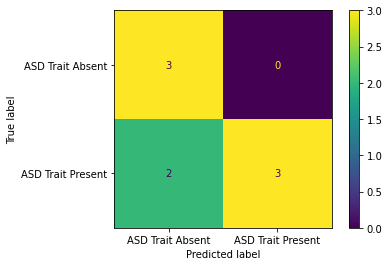

In [20]:
# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline, 'ASD')

# Fit the model to the training data
df_baseline_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_model, X_test, y_test, model_results, 
                               data_desc="baseline dataset (df_baseline)")

# Evaluate on the test set
evaluate_model(df_baseline_model, X_test, y_test)

Our model performed not so good on the baseline data, but let's see the model features, to see if reducing to the important feature can increase the prediction power of our classifier by selecting the most critical variables and eliminating the redundant and irrelevant ones.

### 2.3.2 Modelling the baseline data using Important Features from RF Classifier

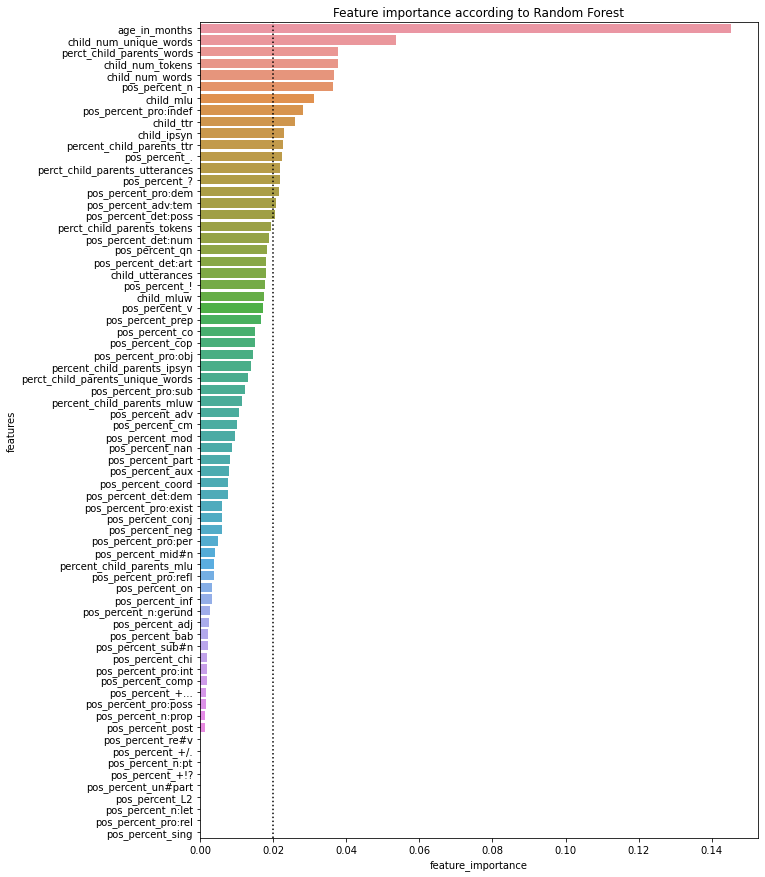

In [21]:
# create a dataframe with feature importances
df_f_importance = pd.DataFrame(data=model.feature_importances_, index=X_train.columns)
# reset index and rename column
df_f_importance = df_f_importance.reset_index()
df_f_importance = df_f_importance.rename(columns={"index":"features", 0:"feature_importance"})
# define column names
df_f_importance = df_f_importance.sort_values(by="feature_importance", ascending=False)

# define figure size
fig = plt.figure(figsize=(10, 15))

# plot
sns.barplot(data=df_f_importance, x="feature_importance", y="features")
# define details
plt.title("Feature importance according to Random Forest", loc="center")
plt.axvline(0.02, linestyle=":", color="black")
plt.show()

In [22]:
# get features whose feature_importance is > 0.02
feat_imp_rf = df_f_importance.loc[df_f_importance["feature_importance"] > 0.02, "features"].tolist()
feat_imp_rf

['age_in_months',
 'child_num_unique_words',
 'perct_child_parents_words',
 'child_num_tokens',
 'child_num_words',
 'pos_percent_n',
 'child_mlu',
 'pos_percent_pro:indef',
 'child_ttr',
 'child_ipsyn',
 'percent_child_parents_ttr',
 'pos_percent_.',
 'perct_child_parents_utterances',
 'pos_percent_?',
 'pos_percent_pro:dem',
 'pos_percent_adv:tem',
 'pos_percent_det:poss']

METRICS
F1 score: 0.75
ROC-AUC: 0.80
Accuracy: 0.75
Precision: 1.00
Recall: 0.60


              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.60      0.75         5

    accuracy                           0.75         8
   macro avg       0.80      0.80      0.75         8
weighted avg       0.85      0.75      0.75         8





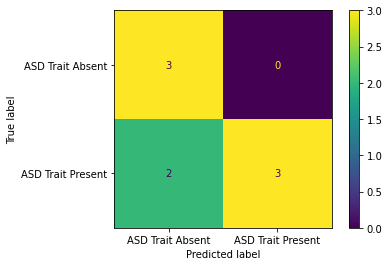

In [23]:
# Get important features for training and test set
X_train_imp = X_train[feat_imp_rf]
X_test_imp = X_test[feat_imp_rf]

# Fit the model to the training data
df_baseline_feature_model = model.fit(X_train_imp, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_feature_model, 
                               X_test_imp, y_test, model_results, 
                               data_desc="baseline dataset using RF important features only")

# Evaluate on the test set
evaluate_model(df_baseline_feature_model, X_test_imp, y_test)

Interestingly, the removal of features did not improve our model. We got thesame F1 score on the evaluation of the test data.



## 3. Generating and Modeling Synthetic Data

We will generate synthetic data and evaluate their performance based on the same condition, using the baseline data from our extraction as a benchmark.

There are few techniques we will use to generate our synthetic data, and do a simple evaluation on each one using thesame method, to see the impact on our model prediction. Few techniques used in this notebook are:

- **Random Oversampling**: This involves randomly duplicating instances from the minority class until the class distribution is balanced. We will use the `RandomOverSampler` from the `imblearn` library to randomly oversample the majority class.
- **Random Undersampling**: This technique involves randomly removing instances from the majority class in order to balance the class distribution. We will also use the `RandomUnderSampler` from the `imblearn` library to randomly undersample the majority class.
- **Near Miss Undersampling**: NearMiss is an under-sampling technique. It is used to undersample the majority class. The technique works by finding the k-nearest samples in the minority class for each sample in the majority class.
- **SMOTE (Synthetic Minority Over-sampling Technique)**: This technique generates synthetic examples of the minority class by interpolating between existing instances.
- **ADASYN (Adaptive Synthetic Sampling)**: This technique generates synthetic examples of the minority class by adaptively adjusting the number of synthetic examples generated for different minority class instances depending on their level of difficulty.
- **Tomek Links**: This technique is based on removing examples that are nearest to the boundary between the two classes, it helps to eliminate the noise and balance the data.
- **Synthetic Data Vault (SDV)**: an ecosystem of libraries that allows users to easily learn datasets to later on generate new Synthetic Data that has the same format and statistical properties as the original dataset.

Note: Later on in the notebook, after we have seen the performance of each dataset, we will look at the top performing ones, conduct exploratory data analysis on them to be able to compare them with the baseline dataset in terms observing the differences between the datasets, most especially for those generated on the baseline data before splitting.

At the end, we want to be able to establish if we need synthetic data or not, for predicting autism in toddlers based on the NLP data extracted.

## 3.1 Generating Synthetic data on the Training Dataset Using the Basic Techniques

We will go ahead to generate all our synthetic data and evaluate each, as we move on. 

We would generate our synthetic data on the training set, as this could allow the model to learn from the synthetic examples and generalize to new, unseen data. Additionally, synthetic data generated on the training set can be used to improve the performance of a model on the under-represented class, which is an important aspect of many classification problems. Therefore, we be fitting each technique to the training data, while we use thesame test data to evaluate all the techniques. We will use our `model_syn_training_data` function for this.

### 3.1.1 Implementing and Evaluating Random Oversampling Technique on Training Data

METRICS
F1 score: 0.57
ROC-AUC: 0.70
Accuracy: 0.62
Precision: 1.00
Recall: 0.40


              precision    recall  f1-score   support

           0       0.50      1.00      0.67         3
           1       1.00      0.40      0.57         5

    accuracy                           0.62         8
   macro avg       0.75      0.70      0.62         8
weighted avg       0.81      0.62      0.61         8





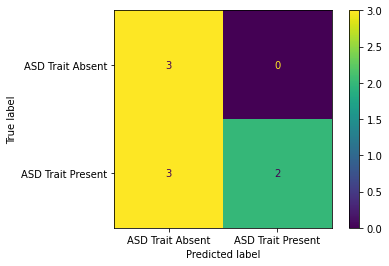

In [24]:
# Generate synthetic data on the training set using random oversampling
X_train_ros, y_train_ros = syn_training_data(RandomOverSampler(random_state=0), 
                                             X_train, y_train)

# merge the generated training data for analysis
ros_train_df = merge_df(X_train_ros, y_train_ros, scaler)

# Export to csv
ros_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_ros_train_df_11022023.csv', index=False)

# Implement the random oversampler
df_ro_sampled_model = model.fit(X_train_ros, y_train_ros)

# Append the metrics to our model_results table
model_results = append_metrics(df_ro_sampled_model, X_test, y_test, model_results, 
                               data_desc="Random Oversampling on Training Data (ros_train_df)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_ro_sampled_model, X_test, y_test)

### 3.1.2 Implementing and Evaluating Random Undersampling Technique on Training Data

As mentioned earlier, this technique will randomly remove instances from the majority class in order to balance the class distribution.

METRICS
F1 score: 0.73
ROC-AUC: 0.57
Accuracy: 0.62
Precision: 0.67
Recall: 0.80


              precision    recall  f1-score   support

           0       0.50      0.33      0.40         3
           1       0.67      0.80      0.73         5

    accuracy                           0.62         8
   macro avg       0.58      0.57      0.56         8
weighted avg       0.60      0.62      0.60         8





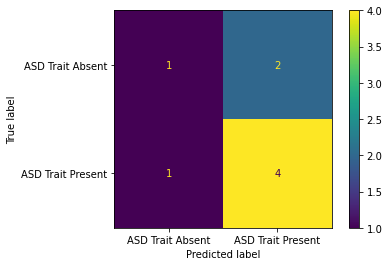

In [25]:
# Generate synthetic data on the training set using random undersampler
X_train_rus, y_train_rus = syn_training_data(RandomUnderSampler(random_state=0), 
                                             X_train, y_train)

# merge the generated training data for analysis
rus_train_df = merge_df(X_train_rus, y_train_rus, scaler)

# Export to csv
rus_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_rus_train_df_11022023.csv', index=False)

# Implement the random undersampler
df_ru_sampled_model = model.fit(X_train_rus, y_train_rus)

# Append the metrics to our model_results table
model_results = append_metrics(df_ru_sampled_model, X_test, y_test, model_results, 
                               data_desc="Random Undersampling on Training Data (rus_train_df)")

# Evaluate our df_ru_sampled_model on the test set
evaluate_model(df_ru_sampled_model, X_test, y_test)

### 3.1.3 Implementing and Evaluating Nearmiss Undersampling Technique on Training Data

METRICS
F1 score: 0.75
ROC-AUC: 0.80
Accuracy: 0.75
Precision: 1.00
Recall: 0.60


              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.60      0.75         5

    accuracy                           0.75         8
   macro avg       0.80      0.80      0.75         8
weighted avg       0.85      0.75      0.75         8





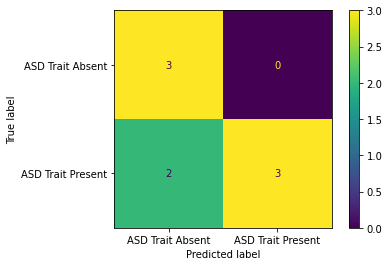

In [26]:
# Generate synthetic data on the training set using random oversampler
X_train_nm, y_train_nm = syn_training_data(NearMiss(n_neighbors=3), 
                                           X_train, y_train)

# merge the generated training data for analysis
nm_train_df = merge_df(X_train_nm, y_train_nm, scaler)

# Export to csv
nm_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_nm_train_df_11022023.csv', index=False)

# Implement the nearmiss undersampler
df_nm_sampled_model = model.fit(X_train_nm, y_train_nm)

# Append the metrics to our model_results table
model_results = append_metrics(df_nm_sampled_model, X_test, y_test, model_results, 
                               data_desc="NearMiss Undersampling on Training Data (nm_train_df)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_nm_sampled_model, X_test, y_test)

### 3.1.4 Implementing and Evaluating SMOTE (Synthetic Minority Over-sampling Technique) on Training Data

METRICS
F1 score: 0.89
ROC-AUC: 0.90
Accuracy: 0.88
Precision: 1.00
Recall: 0.80


              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       1.00      0.80      0.89         5

    accuracy                           0.88         8
   macro avg       0.88      0.90      0.87         8
weighted avg       0.91      0.88      0.88         8





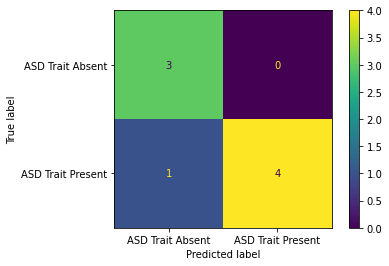

In [27]:
# Generate synthetic data on the training set using random oversampler
X_train_smote, y_train_smote = syn_training_data(SMOTE(random_state=0), 
                                                 X_train, y_train)

# merge the generated training data for analysis
smote_train_df = merge_df(X_train_smote, y_train_smote, scaler)

# Export to csv
smote_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_smote_train_df_11022023.csv', index=False)

# Implement the SMOTE oversampler
df_smote_sampled_model = model.fit(X_train_smote, y_train_smote)

# Append the metrics to our model_results table
model_results = append_metrics(df_smote_sampled_model, X_test, y_test, model_results, 
                               data_desc="SMOTE Oversampling on Training Data (smote_train_df)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_smote_sampled_model, X_test, y_test)

### 3.1.5 Implementing and Evaluating ADASYN on Training Data

METRICS
F1 score: 0.89
ROC-AUC: 0.90
Accuracy: 0.88
Precision: 1.00
Recall: 0.80


              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       1.00      0.80      0.89         5

    accuracy                           0.88         8
   macro avg       0.88      0.90      0.87         8
weighted avg       0.91      0.88      0.88         8





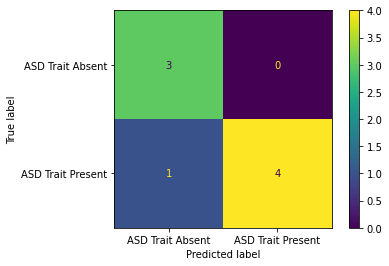

In [28]:
# Generate synthetic data on the training set using adasyn
X_train_asn, y_train_asn = syn_training_data(ADASYN(random_state=0), 
                                             X_train, y_train)

# merge the generated training data for analysis
asn_train_df = merge_df(X_train_asn, y_train_asn, scaler)

# Export to csv
asn_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_asn_train_df_11022023.csv', index=False)

# Implement the ADASYN technique
df_asn_sampled_model = model.fit(X_train_asn, y_train_asn)

# Append the metrics to our model_results table
model_results = append_metrics(df_asn_sampled_model, X_test, y_test, model_results, 
                               data_desc="ADASYN on Training Data (asn_train_df)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_asn_sampled_model, X_test, y_test)

### 3.1.6 Implementing and Evaluating Tomek Links on Training Data


METRICS
F1 score: 0.75
ROC-AUC: 0.80
Accuracy: 0.75
Precision: 1.00
Recall: 0.60


              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.60      0.75         5

    accuracy                           0.75         8
   macro avg       0.80      0.80      0.75         8
weighted avg       0.85      0.75      0.75         8





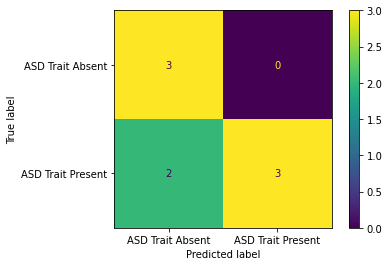

In [29]:
# Generate synthetic data on the training set using Tomek Link
X_train_tlink, y_train_tlink = syn_training_data(TomekLinks(sampling_strategy='auto'), 
                                                 X_train, y_train)

# merge the generated training data for analysis
tlink_train_df = merge_df(X_train_tlink, y_train_tlink, scaler)

# Export to csv
tlink_train_df.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_tlink_train_df_11022023.csv', index=False)

# Implement the random undersampler
df_tlink_sampled_model = model.fit(X_train_tlink, y_train_tlink)

# Append the metrics to our model_results table
model_results = append_metrics(df_tlink_sampled_model, X_test, y_test, model_results, 
                               data_desc="Tomek Links on Training Data (tlink_train_df)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_tlink_sampled_model, X_test, y_test)

## 3.2 Generating Synthetic data on the Baseline Dataset Using the Basic Techniques
Here, we will use the overall baseline data to synthesize our data and generate a new dataset, and then use our initial split function to split into training and test, followed with the evaluation of the split data on the newly synthesized data using RF classifier. We will use the `syn_baseline_data` function we built earlier for this.

### 3.2.1 Implementing and Evaluating Random Oversampling Technique on the baseline data

METRICS
F1 score: 1.00
ROC-AUC: 1.00
Accuracy: 1.00
Precision: 1.00
Recall: 1.00


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      1.00      1.00         5

    accuracy                           1.00        10
   macro avg       1.00      1.00      1.00        10
weighted avg       1.00      1.00      1.00        10





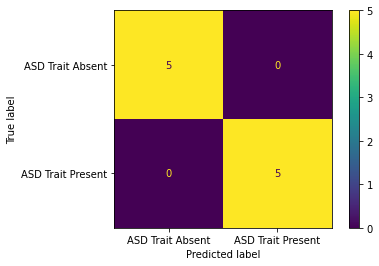

In [30]:
# Implement Random Oversampling on the baseline data
df_baseline_ros = syn_baseline_data(df_baseline, 'ASD', RandomOverSampler(random_state=0))

# Export to csv
df_baseline_ros.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-ros_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_ros, 'ASD')

# Fit the model to the training data
df_baseline_ros_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_ros_model, X_test, y_test, model_results, 
                               data_desc="Random Oversampling on Baseline Data (df_baseline_ros)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_baseline_ros_model, X_test, y_test)

### 3.2.2 Implementing and Evaluating Random Undersampling Technique on the baseline data

METRICS
F1 score: 0.50
ROC-AUC: 0.67
Accuracy: 0.67
Precision: 1.00
Recall: 0.33


              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       1.00      0.33      0.50         3

    accuracy                           0.67         6
   macro avg       0.80      0.67      0.62         6
weighted avg       0.80      0.67      0.62         6





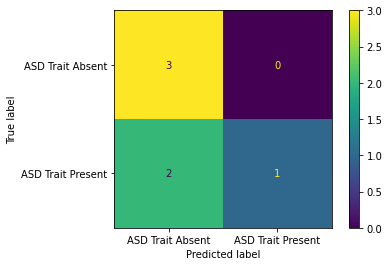

In [31]:
# Implement Random Undersampling on the baseline data
df_baseline_rus = syn_baseline_data(df_baseline, 'ASD', RandomUnderSampler(random_state=0))

# Export to csv
df_baseline_rus.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-rus_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_rus, 'ASD')

# Fit the model to the training data
df_baseline_rus_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_rus_model, X_test, y_test, model_results, 
                               data_desc="Random Undersampling on Baseline Data (df_baseline_rus)")

# Evaluate our df_baseline_rus_model on the test set
evaluate_model(df_baseline_rus_model, X_test, y_test)

### 3.2.3 Implementing and Evaluating Near Miss Technique on the baseline data

METRICS
F1 score: 0.80
ROC-AUC: 0.83
Accuracy: 0.83
Precision: 1.00
Recall: 0.67


              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       1.00      0.67      0.80         3

    accuracy                           0.83         6
   macro avg       0.88      0.83      0.83         6
weighted avg       0.88      0.83      0.83         6





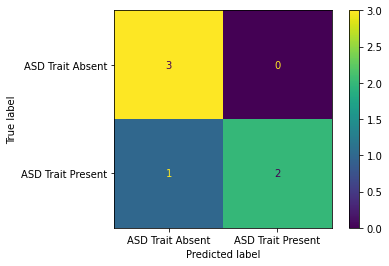

In [32]:
# Implement nearmiss on the baseline data
df_baseline_nearmiss = syn_baseline_data(df_baseline, 'ASD', NearMiss(n_neighbors=3))

# Export to csv
df_baseline_nearmiss.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-nearmiss_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_nearmiss, 'ASD')

# Fit the model to the training data
df_baseline_nearmiss_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_nearmiss_model, X_test, y_test, model_results, 
                               data_desc="NearMiss Undersampling on Baseline Data (df_baseline_nearmiss)")

# Evaluate our df_baseline_nearmiss_model on the test set
evaluate_model(df_baseline_nearmiss_model, X_test, y_test)

### 3.2.4 Implementing and Evaluating SMOTE Technique on the baseline data

METRICS
F1 score: 0.89
ROC-AUC: 0.90
Accuracy: 0.90
Precision: 1.00
Recall: 0.80


              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       1.00      0.80      0.89         5

    accuracy                           0.90        10
   macro avg       0.92      0.90      0.90        10
weighted avg       0.92      0.90      0.90        10





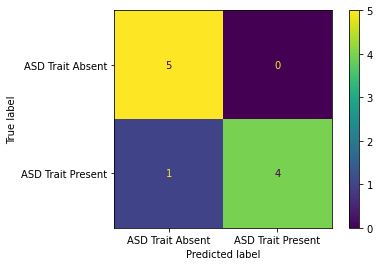

In [33]:
# Implement SMOTE on the baseline data
df_baseline_smote = syn_baseline_data(df_baseline, 'ASD', SMOTE(random_state=0))

# Export to csv
df_baseline_smote.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-smote_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_smote, 'ASD')

# Fit the model to the training data
df_baseline_smote_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_smote_model, X_test, y_test, model_results, 
                               data_desc="SMOTE Oversampling on Baseline Data (df_baseline_smote)")

# Evaluate our df_baseline_smote_model on the test set
evaluate_model(df_baseline_smote_model, X_test, y_test)

### 3.2.5 Implementing and Evaluating ADASYN on baseline data

METRICS
F1 score: 1.00
ROC-AUC: 1.00
Accuracy: 1.00
Precision: 1.00
Recall: 1.00


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         6
           1       1.00      1.00      1.00         5

    accuracy                           1.00        11
   macro avg       1.00      1.00      1.00        11
weighted avg       1.00      1.00      1.00        11





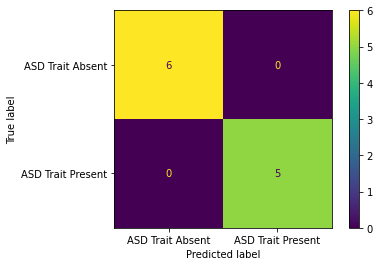

In [34]:
# Implement ADASYN on the baseline data
df_baseline_ADASYN = syn_baseline_data(df_baseline, 'ASD', ADASYN(random_state=0))

# Export to csv
df_baseline_ADASYN.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-ADASYN_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_ADASYN, 'ASD')

# Fit the model to the training data
df_baseline_ADASYN_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_ADASYN_model, X_test, y_test, model_results, 
                               data_desc="ADASYN on Baseline Data (df_baseline_ADASYN)")

# Evaluate our df_baseline_ADASYN_model on the test set
evaluate_model(df_baseline_ADASYN_model, X_test, y_test)

### 3.2.6 Implementing and Evaluating Tomeklink on baseline data

METRICS
F1 score: 0.80
ROC-AUC: 0.90
Accuracy: 0.86
Precision: 0.67
Recall: 1.00


              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       0.67      1.00      0.80         2

    accuracy                           0.86         7
   macro avg       0.83      0.90      0.84         7
weighted avg       0.90      0.86      0.86         7





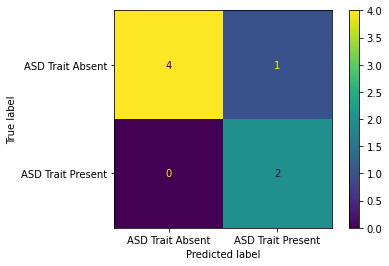

In [35]:
# Implement TomekLinks on the baseline data
df_baseline_TomekLinks = syn_baseline_data(df_baseline, 'ASD', TomekLinks(sampling_strategy='auto'))

# Export to csv
df_baseline_TomekLinks.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline-TomekLinks_11022023.csv', index=False)

# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_TomekLinks, 'ASD')

# Fit the model to the training data
df_baseline_TomekLinks_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_TomekLinks_model, X_test, y_test, model_results, 
                               data_desc="TOMEK Link on Baseline Data (df_baseline_TomekLinks)")

# Evaluate our df_baseline_TomekLinks_model on the test set
evaluate_model(df_baseline_TomekLinks_model, X_test, y_test)

## 3.3 Generating Synthetic data Using Synthetic Data Vault Package (SDV)
Synthetic data vault is an ecosystem of libraries, and we will use each of the library to generate synthetic data. Synthetic data can then be used to supplement, augment and in some cases replace real data when training Machine Learning models. Underneath the hood it uses several probabilistic graphical modeling and deep learning based techniques. For our single tabular data, we will use the following:
- GaussianCopula Model (based on copula funtions) https://sdv.dev/SDV/user_guides/single_table/gaussian_copula.html
- CTGAN Model (based on the GAN-based Deep Learning data synthesizer) https://sdv.dev/SDV/user_guides/single_table/ctgan.html
- CopulaGAN Model (is a variation of the CTGAN Model which takes advantage of the CDF based transformation that the GaussianCopulas apply to make the underlying CTGAN model task of learning the data easier.) https://sdv.dev/SDV/user_guides/single_table/copulagan.html
- TVAE Model (based on the VAE-based Deep Learning data synthesizer by the paper titled Modeling Tabular data using Conditional GAN) https://sdv.dev/SDV/user_guides/single_table/tvae.html

We will implement these techniques on the training data as well as on the overall data.

In [36]:
!pip install -q sdv;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 KB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.2/140.2 KB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.0/47.0 KB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 KB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 KB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 KB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 KB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.0/300.0 KB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 965.4/965.4 KB 21.8 MB/s eta 0:00:00


### 3.3.1 Implementing SDV on the Training Data
Similarly, we will divide our dataset into training and testing autism data firstly on the baseline data, without separating the target. We will then use the training dataset to synthesize the data, using each of the SDV library above. Afterwards, we will run thesame preprocessing step as we did earlier on each data, and train each with our randomforestclassifier model. Overall, we will be exposing our model to thesame condition, except this time, more training data using the SDV library. In most cases, this process is always good when trying out deep learning approach to training data, but let's see how this improve our classical model as well.

Note: We will be generating train and test data with the target combined at first, using thesame parameters as before. After we have synthesized the training data, we will split for modelling.

In [37]:
# Split the baseline data into train and test sets
df_baseline_train, df_baseline_test = train_test_split(df_baseline, test_size=0.2, random_state=0)

For the synthesis, we will use our `df_baseline_train`. We will run all the synthesis model at thesame time, and save each data. We will also need to install the sdv package.

In [38]:
len(df_baseline_train)

30

Now that we have the SDV package installed, let's try to synthesize our training data. Since we have 30 rows of data, let's go ahead to increase this to 2000 rows of training data, and see how that works on the test set we did not include in the synthetic data, which depicts more of real life data. This will help us assume if our model when trained on these quantity of data can actually generalize well on data it has not seen before.

In [39]:
# import all 4 sdv models under the single table scenario
from sdv.tabular import GaussianCopula
from sdv.tabular import CTGAN
from sdv.tabular import CopulaGAN
from sdv.tabular import TVAE

# load the models 
model_Gaussian = GaussianCopula()
model_CTGAN = CTGAN()
model_CopulaGAN = CopulaGAN()
model_TVAE = TVAE()

# fit the models on our training data
model_Gaussian.fit(df_baseline_train)
model_CTGAN.fit(df_baseline_train)
model_CopulaGAN.fit(df_baseline_train)
model_TVAE.fit(df_baseline_train)

# create synthetic data with each fitted model
SDV_training_df_Gaussian = model_Gaussian.sample(2000)
SDV_training_df_CTGAN = model_CTGAN.sample(2000)
SDV_training_df_CopulaGAN = model_CopulaGAN.sample(2000)
SDV_training_df_TVAE = model_TVAE.sample(2000)

# Export the new training set to csv as a checkpoint
SDV_training_df_Gaussian.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_training_syndata_sdv-guassian_11022023.csv', index=False)
SDV_training_df_CTGAN.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_training_syndata_sdv-ctgan_11022023.csv', index=False)
SDV_training_df_CopulaGAN.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_training_syndata_sdv-copgan_11022023.csv', index=False)
SDV_training_df_TVAE.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_training_syndata_sdv-tvae_11022023.csv', index=False)

We will now define a function to split our training and test set, and run thesame preprocessing and evaluation on each of the SDV model. `df_baseline_test` has been defined earlier when we split our data into training and test.

In [40]:
def split_SDV_training_data(new_data, target, df_baseline_test):
  # Split the data into train and test sets
  SDV_X_train = new_data.drop(target, axis=1)
  SDV_y_train = new_data[target]
  baseline_X_test = df_baseline_test.drop(target, axis=1)
  baseline_y_test = df_baseline_test[target]

  # reset index after train test split
  SDV_X_train = SDV_X_train.reset_index(drop=True)
  SDV_y_train = SDV_y_train.reset_index(drop=True)
  baseline_X_test = baseline_X_test.reset_index(drop=True)
  baseline_y_test = baseline_y_test.reset_index(drop=True)

  # Identify categorical columns
  cat_cols = [col for col in SDV_X_train.columns if SDV_X_train[col].dtype=='object']

  # Preprocess the categorical data
  enc = OneHotEncoder(handle_unknown='ignore')
  SDV_X_train_cat = pd.DataFrame(enc.fit_transform(SDV_X_train[cat_cols]).toarray(), columns=enc.get_feature_names(cat_cols))
  baseline_X_test_cat = pd.DataFrame(enc.transform(baseline_X_test[cat_cols]).toarray(), columns=enc.get_feature_names(cat_cols))

  # Preprocess the numerical data
  scaler = StandardScaler()
  SDV_X_train_num = pd.DataFrame(scaler.fit_transform(SDV_X_train.drop(cat_cols, axis=1)), columns=SDV_X_train.drop(cat_cols, axis=1).columns)
  baseline_X_test_num = pd.DataFrame(scaler.transform(baseline_X_test.drop(cat_cols, axis=1)), columns=baseline_X_test.drop(cat_cols, axis=1).columns)

  # Combine the preprocessed data
  SDV_X_train = pd.concat([SDV_X_train_cat, SDV_X_train_num], axis=1)
  baseline_X_test = pd.concat([baseline_X_test_cat, baseline_X_test_num], axis=1)

  return SDV_X_train, SDV_y_train, baseline_X_test, baseline_y_test

#### 3.3.1.1 Modeling and Evaluating Guassian SDV Synthetic Training Data (`SDV_training_df_Gaussian`)



METRICS
F1 score: 0.60
ROC-AUC: 0.47
Accuracy: 0.50
Precision: 0.60
Recall: 0.60


              precision    recall  f1-score   support

           0       0.33      0.33      0.33         3
           1       0.60      0.60      0.60         5

    accuracy                           0.50         8
   macro avg       0.47      0.47      0.47         8
weighted avg       0.50      0.50      0.50         8





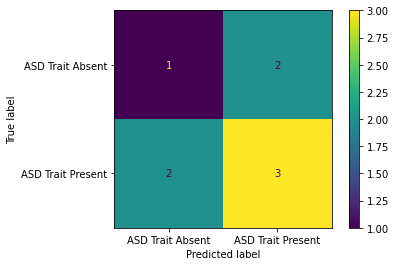

In [41]:
# Implement training on the guassian data
Guassian_X_train, Guassian_y_train, baseline_X_test, baseline_y_test = split_SDV_training_data(SDV_training_df_Gaussian,
                                                                                               'ASD',
                                                                                               df_baseline_test)

# Fit the model to the training data
Guassian_training_df_model = model.fit(Guassian_X_train, Guassian_y_train)

# Append the metrics to our model_results table
model_results = append_metrics(Guassian_training_df_model, baseline_X_test, baseline_y_test, model_results, 
                               data_desc="SDV Guassian on Training Data (SDV_training_df_Gaussian)")

# Evaluate our Guassian_training_df_model on the test set
evaluate_model(Guassian_training_df_model, baseline_X_test, baseline_y_test)

#### 3.3.1.2 Modeling and Evaluating CTGAN SDV Synthetic Training Data (`SDV_training_df_CTGAN`)

METRICS
F1 score: 0.00
ROC-AUC: 0.33
Accuracy: 0.25
Precision: 0.00
Recall: 0.00


              precision    recall  f1-score   support

           0       0.29      0.67      0.40         3
           1       0.00      0.00      0.00         5

    accuracy                           0.25         8
   macro avg       0.14      0.33      0.20         8
weighted avg       0.11      0.25      0.15         8





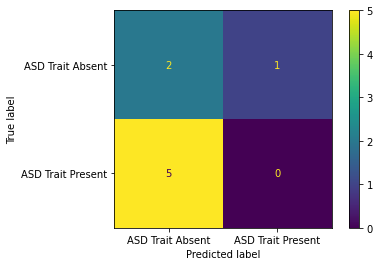

In [42]:
# Implement training on the CTGAN data
CTGAN_X_train, CTGAN_y_train, baseline_X_test, baseline_y_test = split_SDV_training_data(SDV_training_df_CTGAN,
                                                                                         'ASD',
                                                                                         df_baseline_test)

# Fit the model to the training data
CTGAN_training_df_model = model.fit(CTGAN_X_train, CTGAN_y_train)

# Append the metrics to our model_results table
model_results = append_metrics(CTGAN_training_df_model, baseline_X_test, baseline_y_test, model_results, 
                               data_desc="SDV CTGAN on Training Data (SDV_training_df_CTGAN)")

# Evaluate our CTGAN_training_df_model on the test set
evaluate_model(CTGAN_training_df_model, baseline_X_test, baseline_y_test)

#### 3.3.1.3 Modeling and Evaluating CopulaGAN SDV Synthetic Training Data (`SDV_training_df_CopulaGAN`)

METRICS
F1 score: 0.77
ROC-AUC: 0.50
Accuracy: 0.62
Precision: 0.62
Recall: 1.00


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.62      1.00      0.77         5

    accuracy                           0.62         8
   macro avg       0.31      0.50      0.38         8
weighted avg       0.39      0.62      0.48         8





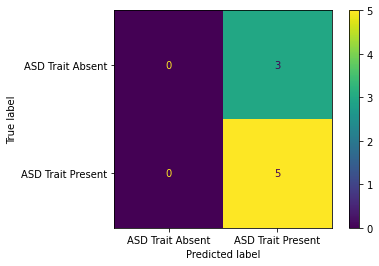

In [43]:
# Implement training on the CopulaGAN data
CopulaGAN_X_train, CopulaGAN_y_train, baseline_X_test, baseline_y_test = split_SDV_training_data(SDV_training_df_CopulaGAN,
                                                                                                 'ASD',
                                                                                                 df_baseline_test)

# Fit the model to the training data
CopulaGAN_training_df_model = model.fit(CopulaGAN_X_train, CopulaGAN_y_train)

# Append the metrics to our model_results table
model_results = append_metrics(CopulaGAN_training_df_model, baseline_X_test, baseline_y_test, model_results, 
                               data_desc="SDV CopulaGAN on Training Data (SDV_training_df_CopulaGAN)")

# Evaluate our CopulaGAN_training_df_model on the test set
evaluate_model(CopulaGAN_training_df_model, baseline_X_test, baseline_y_test)

#### 3.3.1.4 Modeling and Evaluating TVAE SDV Synthetic Training Data (`SDV_training_df_TVAE`)

METRICS
F1 score: 0.33
ROC-AUC: 0.60
Accuracy: 0.50
Precision: 1.00
Recall: 0.20


              precision    recall  f1-score   support

           0       0.43      1.00      0.60         3
           1       1.00      0.20      0.33         5

    accuracy                           0.50         8
   macro avg       0.71      0.60      0.47         8
weighted avg       0.79      0.50      0.43         8





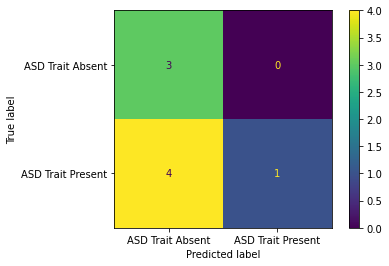

In [44]:
# Implement training on the TVAE data
TVAE_X_train, TVAE_y_train, baseline_X_test, baseline_y_test = split_SDV_training_data(SDV_training_df_TVAE,
                                                                                       'ASD',
                                                                                       df_baseline_test)

# Fit the model to the training data
TVAE_training_df_model = model.fit(TVAE_X_train, TVAE_y_train)

# Append the metrics to our model_results table
model_results = append_metrics(TVAE_training_df_model, baseline_X_test, baseline_y_test, model_results, 
                               data_desc="SDV TVAE on Training Data (SDV_training_df_TVAE)")

# Evaluate our TVAE_training_df_model on the test set
evaluate_model(TVAE_training_df_model, baseline_X_test, baseline_y_test)

As it is, our SDV synthetic training data did not really perform significantly well on the baseline test data.

An assumption would be that since these models are not performing well when trained on the synthetic training data across board, after evaluating with the baseline data it has not seen before, it shows it is overfitting. This could be because we modelled them on the training data only. As a result of this, we will go ahead to implement these models to generate the SDV synthetic data based on the whole data, and split afterwards to see how they perform. We will utilize the initial `df_baseline` data

### 3.3.2 Implementing SDV on the Overall Baseline Data
Here, we will use the baseline dataset to synthesize the data, using each of the SDV library . Afterwards, we will run thesame preprocessing step as we did earlier on each data, and train each with our randomforestclassifier model. Overall, we will be exposing our model to thesame condition, except this time, synthetic data is generated from the baseline data instead of the training data.

We will generate 5000 samples using each SDV technique on the baseline data. As mentioned earlier, SDV uses the deep learning technique to basically learn from the data and synthesize.

In [45]:
# import all 4 sdv models under the single table scenario
from sdv.tabular import GaussianCopula
from sdv.tabular import CTGAN
from sdv.tabular import CopulaGAN
from sdv.tabular import TVAE

# load the models 
model_Gaussian = GaussianCopula()
model_CTGAN = CTGAN()
model_CopulaGAN = CopulaGAN()
model_TVAE = TVAE()

# fit the models on our training data
model_Gaussian.fit(df_baseline)
model_CTGAN.fit(df_baseline)
model_CopulaGAN.fit(df_baseline)
model_TVAE.fit(df_baseline)

# create synthetic data with each fitted model
baseline_data_model_Gaussian = model_Gaussian.sample(5000)
baseline_data_model_CTGAN = model_CTGAN.sample(5000)
baseline_data_model_CopulaGAN = model_CopulaGAN.sample(5000)
baseline_data_model_TVAE = model_TVAE.sample(5000)

# Export the baseline training set to csv as a checkpoint
baseline_data_model_Gaussian.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_baseline-sdv-guassian_28012023_tosinharold.csv', index=False)
baseline_data_model_CTGAN.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_baseline-sdv-ctgan_28012023_tosinharold.csv', index=False)
baseline_data_model_CopulaGAN.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_baseline-sdv-copgan_28012023_tosinharold.csv', index=False)
baseline_data_model_TVAE.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_baseline-sdv-tvae_28012023_tosinharold.csv', index=False)

Great! Now, we model and evaluate each data separately, using Random Forest Classifier, similar preprocessing method as we have used before and see where that leads us. We will use our initial `split_preprocessor` function to preprocess and split our data.

#### 3.3.2.1 Modeling and Evaluating the SDV Gaussian Synthetic Data Generated with the Baseline Data (`baseline_data_model_Gaussian`)

METRICS
F1 score: 0.82
ROC-AUC: 0.84
Accuracy: 0.85
Precision: 0.84
Recall: 0.80


              precision    recall  f1-score   support

           0       0.85      0.88      0.87       563
           1       0.84      0.80      0.82       437

    accuracy                           0.85      1000
   macro avg       0.84      0.84      0.84      1000
weighted avg       0.85      0.85      0.85      1000





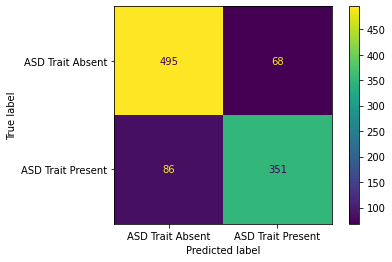

In [46]:
# Preprocess and split baseline Gaussian baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(baseline_data_model_Gaussian, 'ASD')

# Fit the model to the training data
df_baseline_guassian_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_guassian_model, X_test, y_test, model_results, 
                               data_desc="SDV Guassian on Baseline Data (baseline_data_model_Gaussian)")

# Evaluate our df_baseline_guassian_model on the testing set
evaluate_model(df_baseline_guassian_model, X_test, y_test)

#### 3.3.2.2 Modeling and Evaluating the SDV CTGAN Synthetic Data Generated with the Baseline Data (`baseline_data_model_CTGAN`)

METRICS
F1 score: 0.00
ROC-AUC: 0.50
Accuracy: 0.79
Precision: 0.00
Recall: 0.00


              precision    recall  f1-score   support

           0       0.79      1.00      0.89       794
           1       0.00      0.00      0.00       206

    accuracy                           0.79      1000
   macro avg       0.40      0.50      0.44      1000
weighted avg       0.63      0.79      0.70      1000





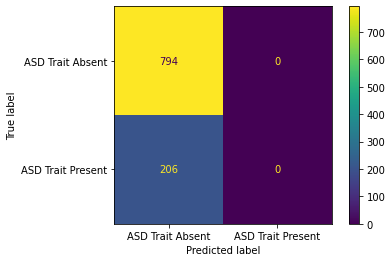

In [47]:
# Preprocess and split baseline CTGAN data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(baseline_data_model_CTGAN, 'ASD')

# Fit the model to the training data
df_baseline_CTGAN_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_CTGAN_model, X_test, y_test, model_results, 
                               data_desc="SDV CTGAN on Baseline Data (baseline_data_model_CTGAN)")

# Evaluate our df_baseline_CTGAN_model on the testing set
evaluate_model(df_baseline_CTGAN_model, X_test, y_test)

#### 3.3.2.3 Modeling and Evaluating the SDV CopulaGAN Synthetic Data Generated with the Baseline Data (`baseline_data_model_CopulaGAN`)

METRICS
F1 score: 0.04
ROC-AUC: 0.50
Accuracy: 0.63
Precision: 0.33
Recall: 0.02


              precision    recall  f1-score   support

           0       0.64      0.97      0.77       638
           1       0.33      0.02      0.04       362

    accuracy                           0.63      1000
   macro avg       0.49      0.50      0.41      1000
weighted avg       0.53      0.63      0.51      1000





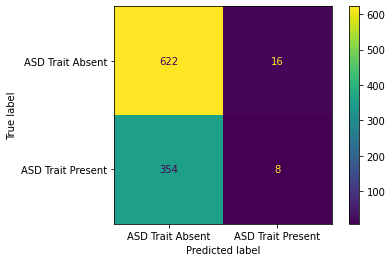

In [48]:
# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(baseline_data_model_CopulaGAN, 'ASD')

# Fit the model to the training data
df_baseline_copulaGAN_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_copulaGAN_model, X_test, y_test, model_results, 
                               data_desc="SDV CopulaGAN on Baseline Data (baseline_data_model_CopulaGAN)")

# Evaluate our df_baseline_CopulaGAN_model on the testing set
evaluate_model(df_baseline_copulaGAN_model, X_test, y_test)

#### 3.3.2.4 Analysing, Modeling and Evaluating the SDV TVAE Synthetic Data Generated with the Baseline Data (`baseline_data_model_TVAE`)

METRICS
F1 score: 0.00
ROC-AUC: 0.50
Accuracy: 0.98
Precision: 0.00
Recall: 0.00


              precision    recall  f1-score   support

           0       0.98      1.00      0.99       978
           1       0.00      0.00      0.00        22

    accuracy                           0.98      1000
   macro avg       0.49      0.50      0.49      1000
weighted avg       0.96      0.98      0.97      1000





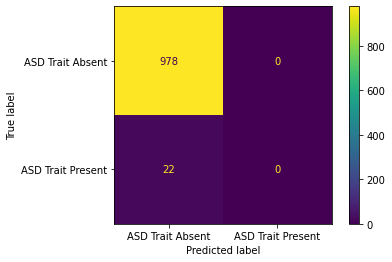

In [49]:
# Preprocess and split baseline data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(baseline_data_model_TVAE, 'ASD')

# Fit the model to the training data
df_baseline_TVAE_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_TVAE_model, X_test, y_test, model_results, 
                               data_desc="SDV TVAE on Baseline Data (baseline_data_model_TVAE)")

# Evaluate our df_baseline_TVAE_model on the testing set
evaluate_model(df_baseline_TVAE_model, X_test, y_test)

## 3.4 Bringing it all together

Now that we have all the techniques used in generating synthetic data at different level and evaluating using RF classifier, let's sort our `model_results` table to look at the performance from top to bottom for easy view.

In [50]:
# Generate the model_results table and sort from highest to smallest by F1 Score
model_results = model_results.sort_values(by='F1 Score', ascending=False).reset_index(drop=True)
model_results

,Data Description,F1 Score,ROC AUC,Accuracy,Precision,Recall
0,ADASYN on Baseline Data (df_baseline_ADASYN),1.000,1.000,1.000,1.000,1.000
1,Random Oversampling on Baseline Data (df_basel...,1.000,1.000,1.000,1.000,1.000
2,SMOTE Oversampling on Baseline Data (df_baseli...,0.889,0.900,0.900,1.000,0.800
3,SMOTE Oversampling on Training Data (smote_tra...,0.889,0.900,0.875,1.000,0.800
4,ADASYN on Training Data (asn_train_df),0.889,0.900,0.875,1.000,0.800
5,SDV Guassian on Baseline Data (baseline_data_m...,0.820,0.841,0.846,0.838,0.803
6,NearMiss Undersampling on Baseline Data (df_ba...,0.800,0.833,0.833,1.000,0.667
7,TOMEK Link on Baseline Data (df_baseline_Tomek...,0.800,0.900,0.857,0.667,1.000
8,SDV CopulaGAN on Training Data (SDV_training_d...,0.769,0.500,0.625,0.625,1.000
9,baseline dataset using RF important features only,0.750,0.800,0.750,1.000,0.600


As shown in the table above in respect to balanced classification, `ADASYN and Random Oversampling` generated on the baseline data, had the highest performance with **F1 score of 1.00 and ROC-AUC score of 1.00**. 

When the synthetic data was generated on the training data only, and evaluated on the test set it has never seen before, `SMOTE and ADASYN` improved the performance of our baseline model from F1 score of **0.750 to 0.889** and ROC-AUC score from **0.8 to 0.9**.

With respect to learning on the data and increasing the quantity of our dataset with the help of SDV, on the training data, only `SDV copulaGAN` performed fairly as 9th on the list, when evaluated with a baseline test set it has never seen, w**ith F1 score of 0.769, however with a low RUC-AUC score of 0.5**. Nonetheless, when the different SDV techniques were implemented on the overall baseline data before splitting, `SDV Guassian` performed a lot better with F1 score of 0.82 and RUC-AUC score of 0.84.

Generally, our baseline dataset did not make the top 10 in terms of performance based on the F1 score.

## 3.5 Merging Techniques
Looking at the top data above that gave the best performance, we will go ahead to merge the technique to generate the data by volume and balanced class, and see how the performance would be different.

Based on that information, we will merge:
- SDV Guassian and ADASYN on Baseline data

### 3.5.1 Implementing and Evaluating SDV Guassian and Random Undersampling on Baseline data

METRICS
F1 score: 0.85
ROC-AUC: 0.86
Accuracy: 0.86
Precision: 0.85
Recall: 0.86


              precision    recall  f1-score   support

           0       0.87      0.87      0.87       575
           1       0.85      0.86      0.85       501

    accuracy                           0.86      1076
   macro avg       0.86      0.86      0.86      1076
weighted avg       0.86      0.86      0.86      1076





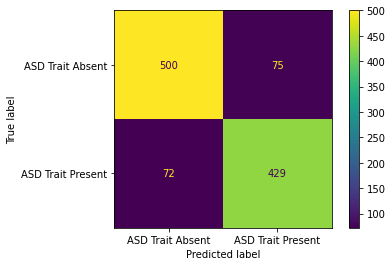

In [52]:
# Implement ADASYN on the baseline sdv guassian data
df_baseline_sdv_guassian_asn = syn_baseline_data(baseline_data_model_Gaussian, 'ASD', ADASYN(random_state=0))

# Export to csv
df_baseline_sdv_guassian_asn.to_csv('/content/drive/MyDrive/DS-ML projects/ASD Prediction/data/nlp_syndata_baseline_sdv_guassian_asn_11022023.csv', index=False)

# Preprocess and split the data
scaler, X_train, X_test, y_train, y_test = split_preprocessor(df_baseline_sdv_guassian_asn, 'ASD')

# Fit the model to the training data
df_baseline_sdv_guassian_asn_model = model.fit(X_train, y_train)

# Append the metrics to our model_results table
model_results = append_metrics(df_baseline_sdv_guassian_asn_model, X_test, y_test, model_results, 
                               data_desc="ADASYN on baseline SDV Guassian Data (df_baseline_sdv_guassian_asn)")

# Evaluate our df_ro_sampled_model on the test set
evaluate_model(df_baseline_sdv_guassian_asn_model, X_test, y_test)

### 3.5.3 Generating the Top 5 Synthetic Data Based on Best Performance

In [53]:
# Generate the model_results table and sort from highest to smallest by F1 Score for the top 10
model_results = model_results.sort_values(by='F1 Score', ascending=False).reset_index(drop=True)
model_results[:10]

,Data Description,F1 Score,ROC AUC,Accuracy,Precision,Recall
0,ADASYN on Baseline Data (df_baseline_ADASYN),1.000,1.000,1.000,1.000,1.000
1,Random Oversampling on Baseline Data (df_basel...,1.000,1.000,1.000,1.000,1.000
2,SMOTE Oversampling on Baseline Data (df_baseli...,0.889,0.900,0.900,1.000,0.800
3,SMOTE Oversampling on Training Data (smote_tra...,0.889,0.900,0.875,1.000,0.800
4,ADASYN on Training Data (asn_train_df),0.889,0.900,0.875,1.000,0.800
5,ADASYN on baseline SDV Guassian Data (df_basel...,0.854,0.863,0.863,0.851,0.856
6,SDV Guassian on Baseline Data (baseline_data_m...,0.820,0.841,0.846,0.838,0.803
7,NearMiss Undersampling on Baseline Data (df_ba...,0.800,0.833,0.833,1.000,0.667
8,TOMEK Link on Baseline Data (df_baseline_Tomek...,0.800,0.900,0.857,0.667,1.000
9,SDV CopulaGAN on Training Data (SDV_training_d...,0.769,0.500,0.625,0.625,1.000


## 3.6 Summary on Synthetic Data Generation

Having looked at different techniques to generate synthetic data and have been able to establish the performance of the baseline data and each synthetic data generated with the training data and the baseline data using Random Classifier model, and a seed of 0 for the random_state across board, here are few things to take note:

- `ADASYN` and `Random Oversampling` on Baseline data had the highest **F1 score of 1 and ROC AUC score of 1**, while `SMOTE` and `ADASYN` generated on the training data only and tested on the test dataset it has never seen both gave us an **F1 score of 0.889 and 0.900 F1 score and ROC AUC respectively**.
- Using our `ADASYN` technique to generate new synthetic data on the synthetic data generated using `SDV Guassian` technique on the baseline data, did not perform better than synthetic data generated with the `ADASYN` alone but was okay. However, the introduction of the `ADASYN` technique on the SDV Guassian data, improved the performance of the SDV Guassian model alone.

Overall, the introduction of some of these synthetic data generation techniques on our NLP extracted baseline data improved the performance of the model, either generated on the training set alone or on the overall dataset.

**Nonetheless, it is worth paying attention to the following**: Since generating synthetic data on the training set to evaluate on the baseline test data it has never seen before is usually a good practice, it would be good to use the most performing technique in this scenario. However, with more data and balanced class, using the `SDV Guassian and ADASYN or Random Oversampling` technique has a good potential to getting a better model trained on more data and a balanced class.

Now that we have established the performance of each dataset, let's explore the top 5 synthetic data and see how they differ from the baseline dataset, which can also inform which technique is best to use.

# 4. Exploratory Data Analysis on the Top Synthetic Data in comparison with the Baseline Data

As mentioned earlier, we will explore our baseline data and the top synthetic data, to help us understand the characteristics of each, and how that could have impacted the performance of the model. In order to ensure we are able to look across each technique generated based on training data, baseline data, SDV and merged technique, we will go ahead to explore the following in addition to the baseline dataset (`df_baseline`):
- ADASYN data generated on Baseline Data (`df_baseline_ADASYN`)
- ADASYN data generated on Training Data (`asn_train_df`)
- SDV Guassian data generated on Baseline Data (`baseline_data_model_Gaussian`)
- ADASYN datae generated on baseline SDV Guassian Data (`df_baseline_sdv_guassian_asn`)

Please note that ADASYN was picked since it performed well both on training and overall dataset, in addition to the best SDV technique, and merging technique.

Before we commence, we will replace the 0s and 1s in our dataset with their original label for each of the dataset for clarity.

In [68]:
# Replace 1 and 0 with ASD and TYP in our target column
df_baseline['ASD'] = df_baseline['ASD'].replace({1 : "ASD", 0 : "TYP"})
df_baseline_ADASYN['ASD'] = df_baseline_ADASYN['ASD'].replace({1 : "ASD", 0 : "TYP"})
asn_train_df['ASD'] = asn_train_df['ASD'].replace({1 : "ASD", 0 : "TYP"})
baseline_data_model_Gaussian['ASD'] = baseline_data_model_Gaussian['ASD'].replace({1 : "ASD", 0 : "TYP"})
df_baseline_sdv_guassian_asn['ASD'] = df_baseline_sdv_guassian_asn['ASD'].replace({1 : "ASD", 0 : "TYP"})

In [55]:
# return the shape of each dataframe
print("Baseline Data shape:", df_baseline.shape)
print("Adasyn on Baseline Data shape:", df_baseline_ADASYN.shape)
print("Adasyn on Training Data shape:", asn_train_df.shape)
print("Guassian SDV on Baseline Data shape:", baseline_data_model_Gaussian.shape)
print("Adasyn on Guassian SDV Baseline Data shape:", df_baseline_sdv_guassian_asn.shape)

Baseline Data shape: (38, 71)
Adasyn on Baseline Data shape: (51, 71)
Adasyn on Training Data shape: (43, 71)
Guassian SDV on Baseline Data shape: (5000, 71)
Adasyn on Guassian SDV Baseline Data shape: (5380, 71)


## 4.1 Univariate Analysis
We will go ahead to utilize the `univariate_analysis()` function we created earlier for each of the dataset.

### 4.1.1 Univariate Analysis of the Baseline Data

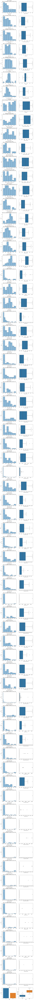

In [56]:
# Univariate analysis on the df_baseline
univariate_analysis(df_baseline)

### 4.1.2 Univariate Analysis of ADASYN Synthetic Data Generated on the Baseline Data

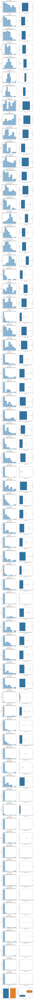

In [57]:
# Univariate analysis on the df_baseline_ADASYN
univariate_analysis(df_baseline_ADASYN)

### 4.1.3 Univariate Analysis of ADASYN Synthetic Data Generated on the Training Data

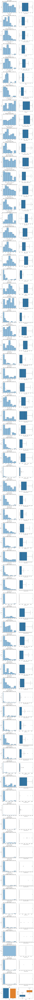

In [58]:
# Univariate analysis on the asn_train_df
univariate_analysis(asn_train_df)

### 4.1.4 Univariate Analysis of SDV Guassian Synthetic Data Generated on the Baseline Data

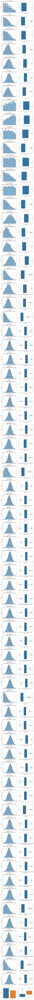

In [69]:
# Univariate analysis on the baseline_data_model_Gaussian
univariate_analysis(baseline_data_model_Gaussian)

### 4.1.5 Univariate Analysis of ADASYN Synthetic Data Generated on the SDV Guassian Baseline Data

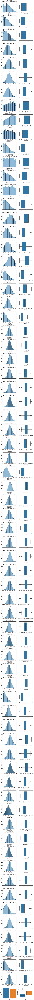

In [70]:
# Univariate analysis on the df_baseline_sdv_guassian_asn
univariate_analysis(df_baseline_sdv_guassian_asn)

While assessing each feature characteristics and comparing with the baseline dataset, the synthetic data generated for each of the ones analysed among the top 4 selected, they inherited the properties of the baseline data at least to a good extent, without much changes in the mean and median. The major difference was in the balanced classification with ADASYN.

## 4.2 Bivariate Analysis

### 4.2.1 Numerical vs Categorical
We will also utilize our `bivariate_analysis()` function we defined earlier for each of the dataset. Since we have only one categorical which is our target column, we expect to see all our features (numerical rows) analysed on the label.

#### 4.2.1.1 Baseline Data

Plotting Numeric vs Categorical Features


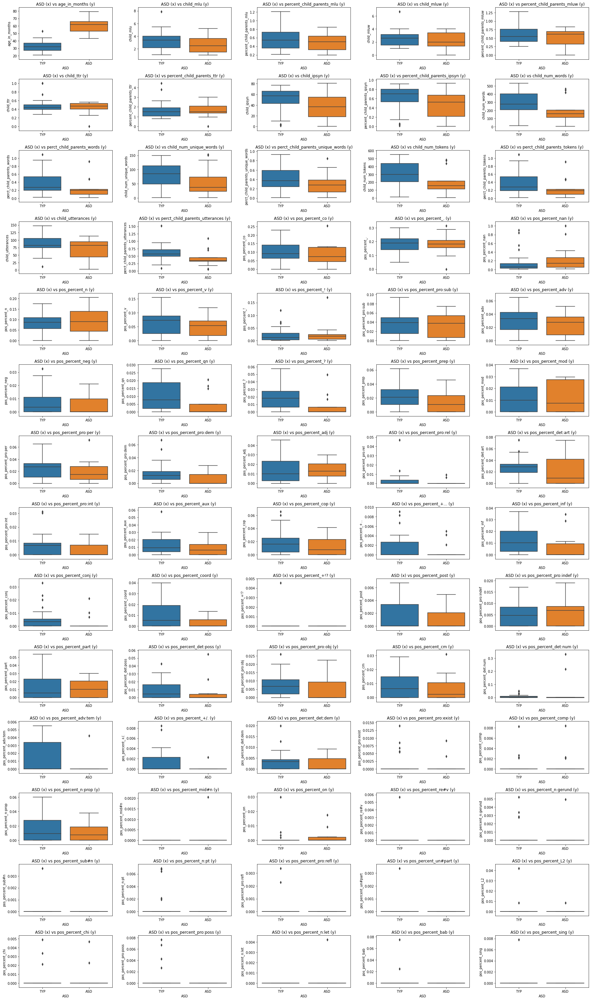

In [59]:
# bivariate analysis on the df_baseline
bivariate_analysis(df_baseline, "ASD")

#### 4.2.1.2 ADASYN Synthetic Data Generated on the Baseline Data

Plotting Numeric vs Categorical Features


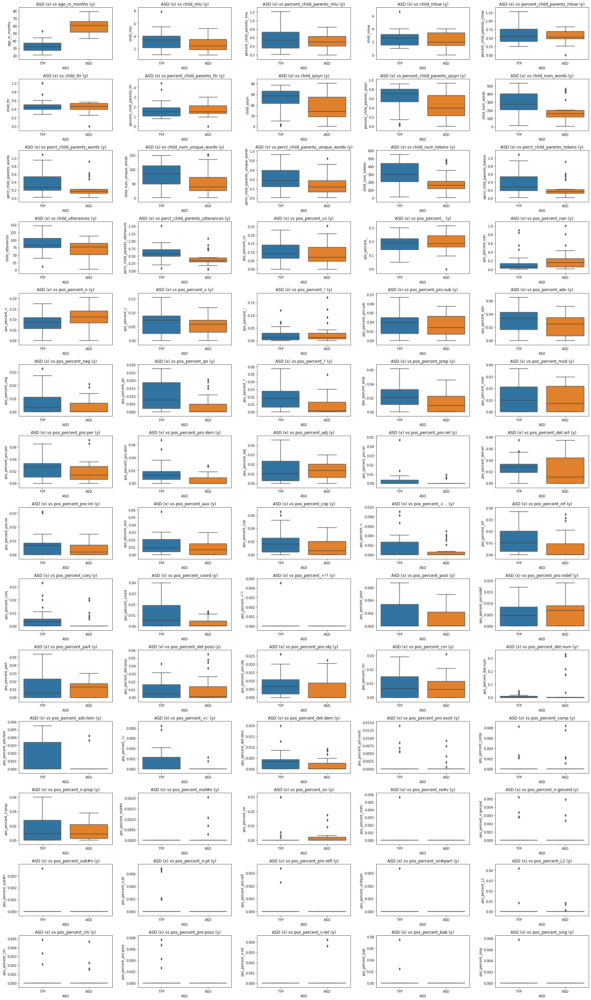

In [61]:
# bivariate analysis on the df_baseline_ADASYN
bivariate_analysis(df_baseline_ADASYN, "ASD")

#### 4.2.1.3 ADASYN Synthetic Data Generated on the Training Data

Plotting Numeric vs Categorical Features


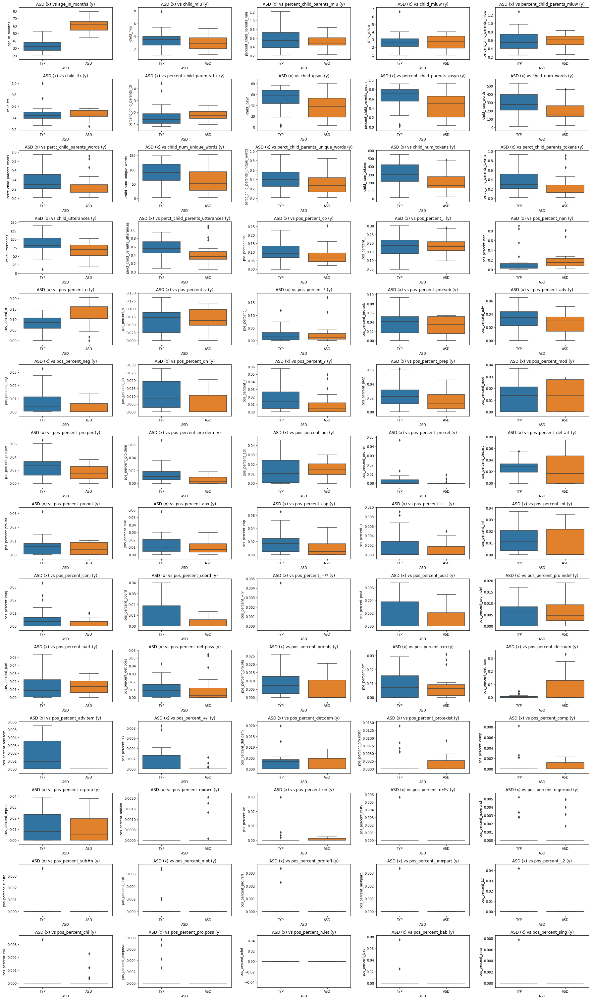

In [62]:
# bivariate analysis on the asn_train_df
bivariate_analysis(asn_train_df, "ASD")

#### 4.2.1.4 SDV Guassian Synthetic Data Generated on the Baseline Data

Plotting Numeric vs Categorical Features


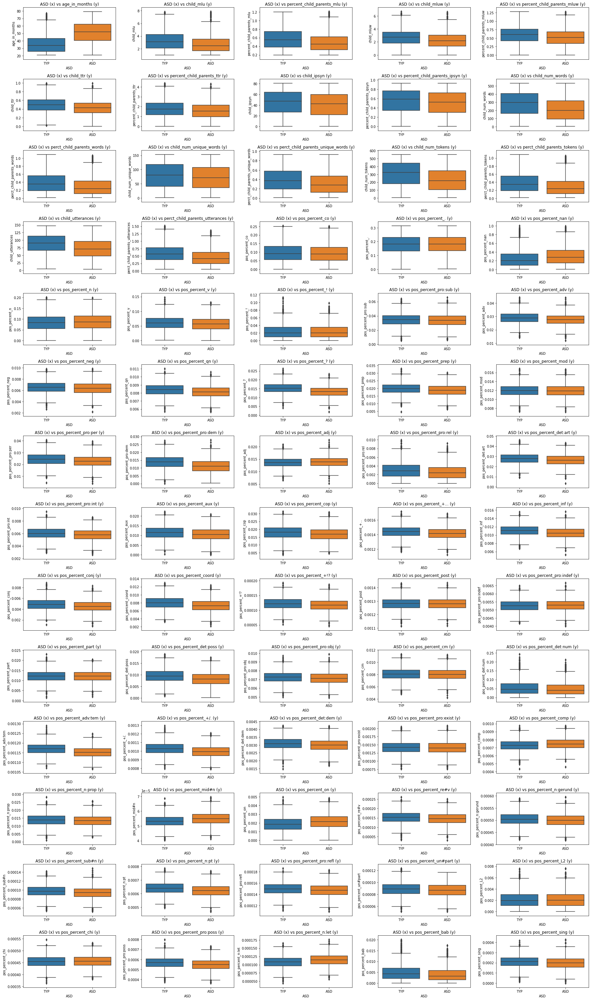

In [71]:
# bivariate analysis on the baseline_data_model_Gaussian
bivariate_analysis(baseline_data_model_Gaussian, "ASD")

#### 4.2.1.5 ADASYN Synthetic Data Generated on the SDV Guassian Baseline Data

Plotting Numeric vs Categorical Features


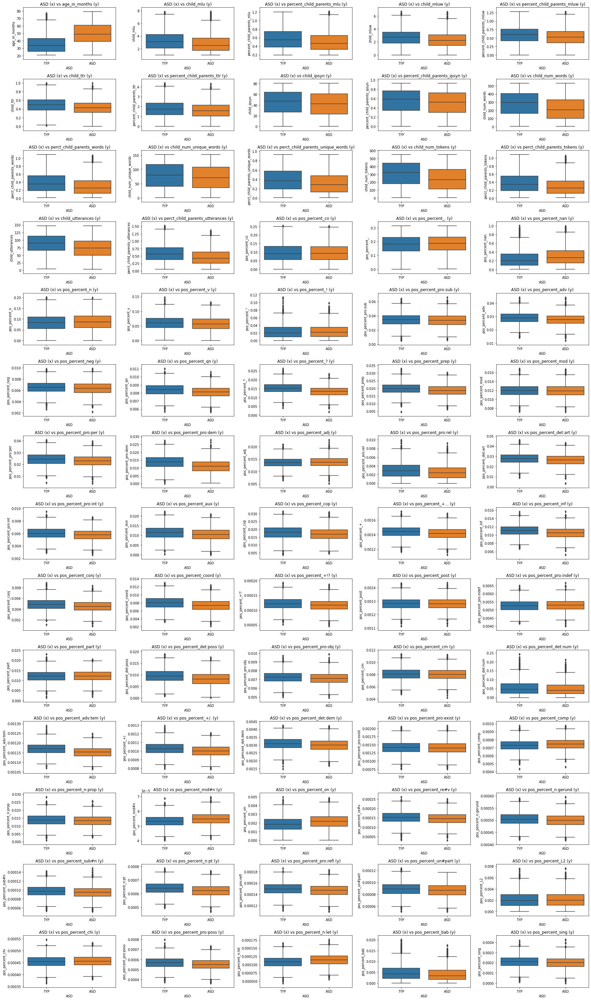

In [72]:
# bivariate analysis on the df_baseline_sdv_guassian_asn
bivariate_analysis(df_baseline_sdv_guassian_asn, "ASD")

Looking at the bivariate analysis across all the features vs our label, there is not much of changes in the characteristics. However, due to more data, there was slight change in the distribution of those generated with the SDV, but not to an extremely large extent. In a nutshell, our synthetic data that performed well, still managed to inherit the characteristics of the baseline data, based on this bivariate analysis.

### 4.2.2 Numerical vs Numerical
Due to the high number of numerical features we have, we will only be using the `correlation_matrix` function defined earlier, to assess the correlation of each features across the dataframe. We will also include the label.

#### 4.2.2.1 Baseline Data

Plotting Correlation Matrix


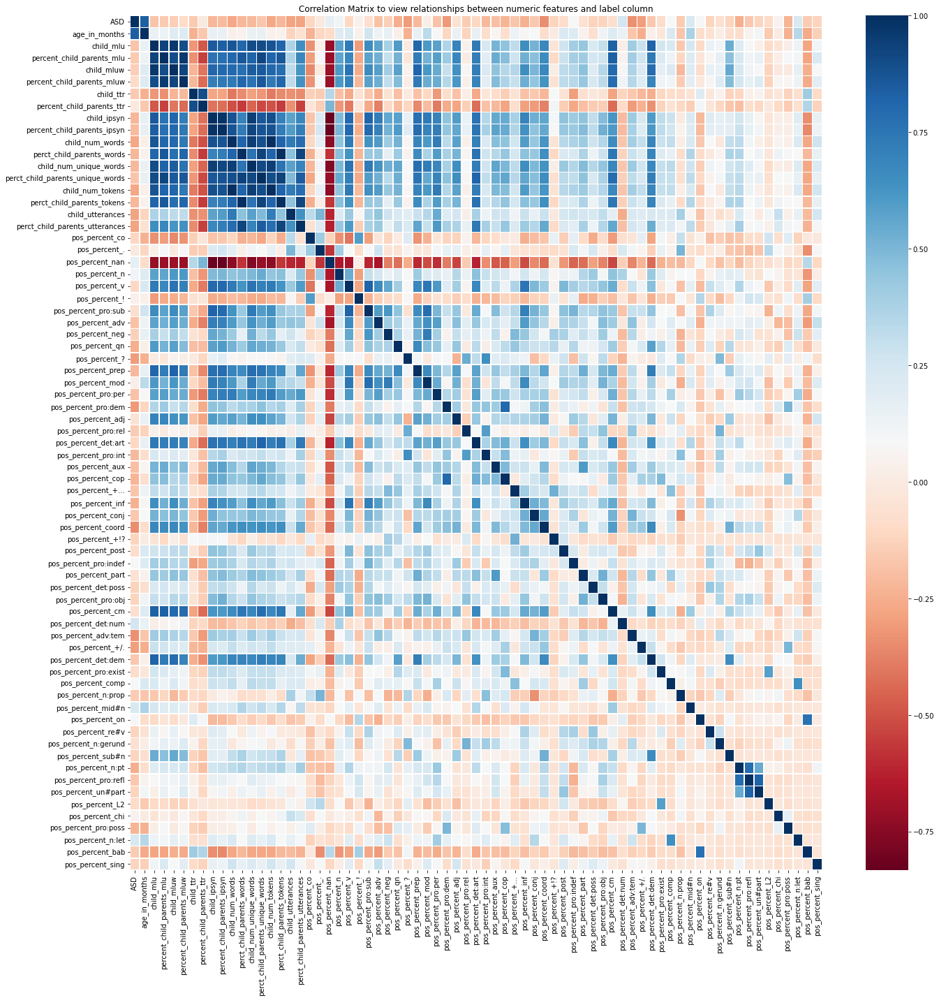

In [63]:
# Replace ASD and TYP label with 1 and 0 in our target column
df_baseline['ASD'] = df_baseline['ASD'].replace({"ASD": 1, "TYP": 0})

# Plot correlation matrix
correlation_matrix(df_baseline, 'ASD')

#### 4.2.2.2 ADASYN Synthetic Data Generated on the Baseline Data

Plotting Correlation Matrix


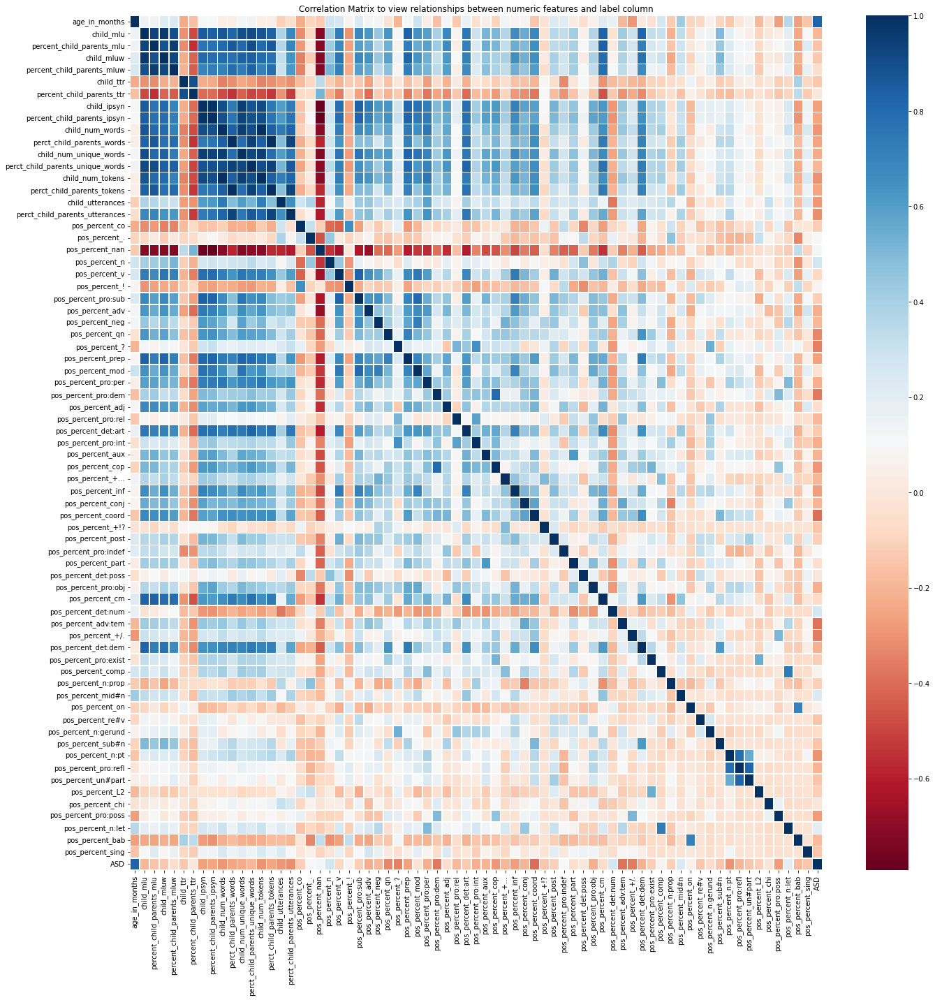

In [64]:
# Replace ASD and TYP label with 1 and 0 in our target column
df_baseline_ADASYN['ASD'] = df_baseline_ADASYN['ASD'].replace({"ASD": 1, "TYP": 0})

# Plot correlation matrix
correlation_matrix(df_baseline_ADASYN, 'ASD')

#### 4.2.2.3 ADASYN Synthetic Data Generated on the Training Data

Plotting Correlation Matrix


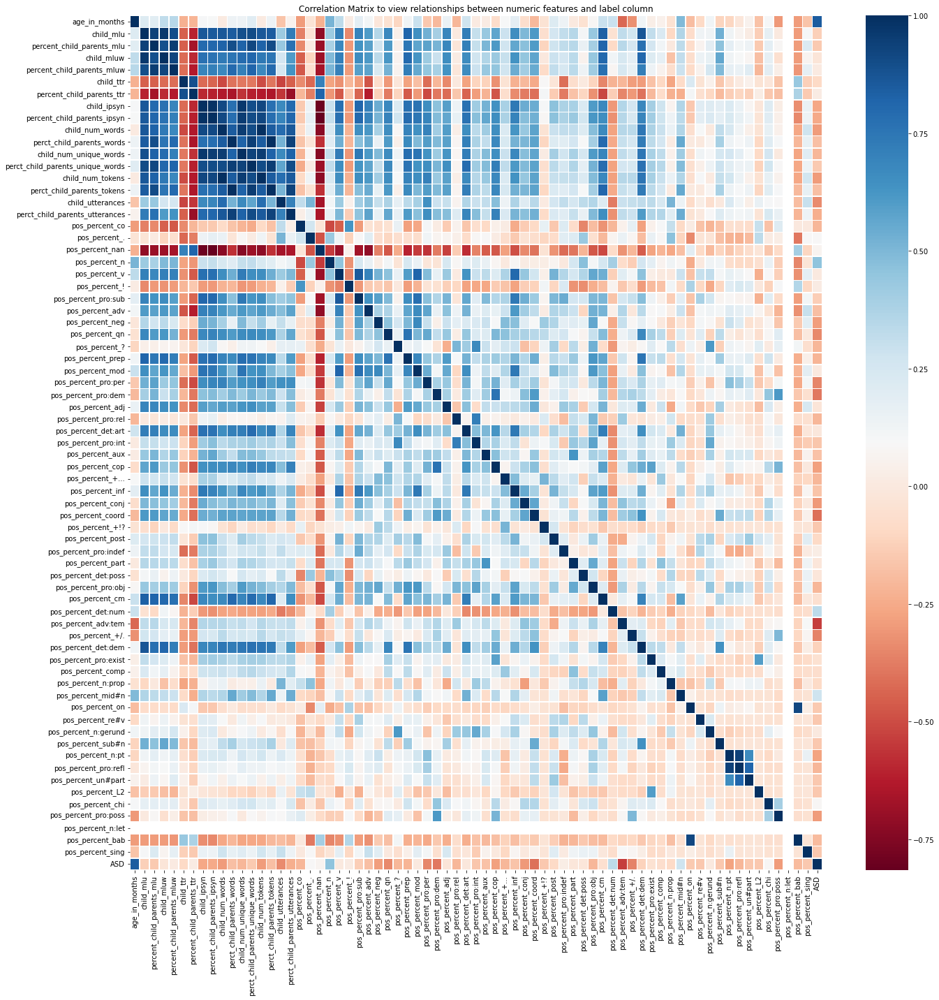

In [65]:
# Replace ASD and TYP label with 1 and 0 in our target column
asn_train_df['ASD'] = asn_train_df['ASD'].replace({"ASD": 1, "TYP": 0})

# Plot correlation matrix
correlation_matrix(asn_train_df, 'ASD')

#### 4.2.2.4 SDV Guassian Synthetic Data Generated on the Baseline Data

Plotting Correlation Matrix


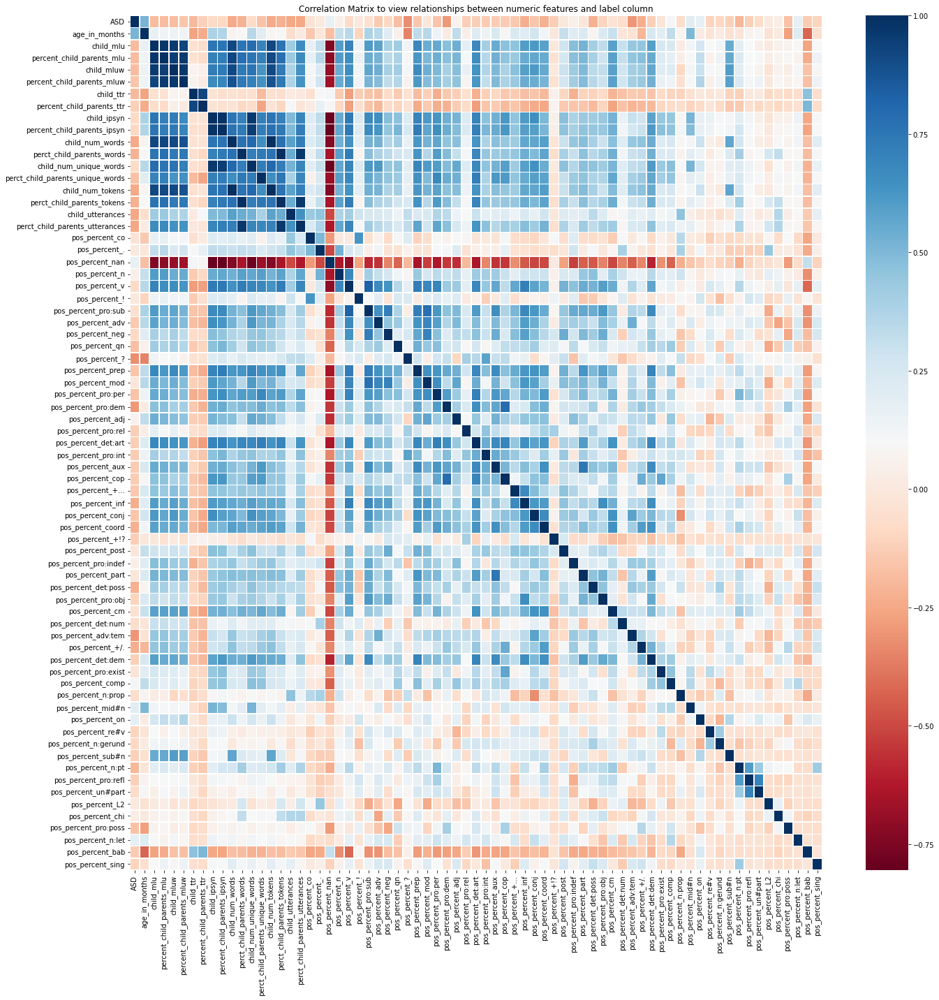

In [66]:
# Replace ASD and TYP label with 1 and 0 in our target column
baseline_data_model_Gaussian['ASD'] = baseline_data_model_Gaussian['ASD'].replace({"ASD": 1, "TYP": 0})

# Plot correlation matrix
correlation_matrix(baseline_data_model_Gaussian, 'ASD')

#### 4.2.2.5 ADASYN Synthetic Data Generated on the SDV Guassian Baseline Data

Plotting Correlation Matrix


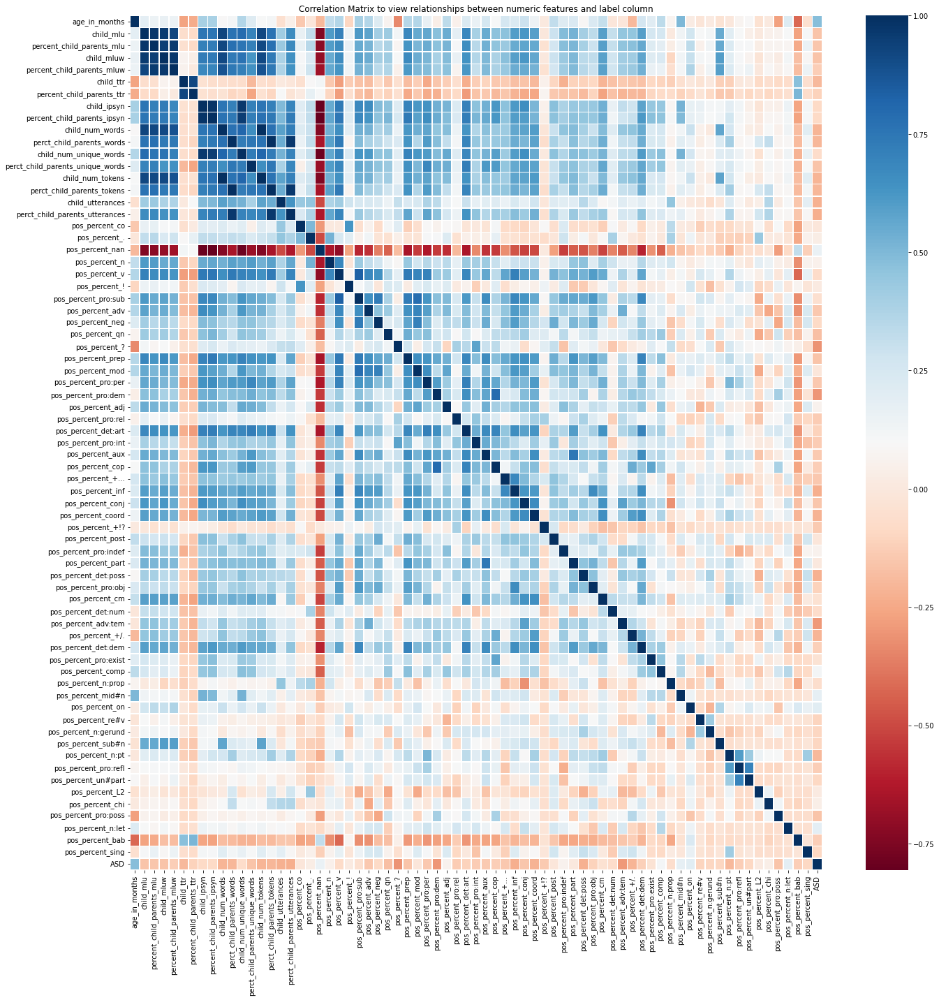

In [67]:
# Replace ASD and TYP label with 1 and 0 in our target column
df_baseline_sdv_guassian_asn['ASD'] = df_baseline_sdv_guassian_asn['ASD'].replace({"ASD": 1, "TYP": 0})

# Plot correlation matrix
correlation_matrix(df_baseline_sdv_guassian_asn, 'ASD')

Also, looking at the correlation between each of the datasets, the changes in the properties of all the dataset in comparison to the baseline was insignificant, which means, the generated synthetic data inherited the characteristics of the baseline data to an optimal level.